
# Movie Profitability Machine Learning Model
# Summary of "Movies" dataset:

Imagine we are a movie studio executive deciding which stories deserve a chance on the big screen. Every script promises emotion, artistry, and entertainment, but only a select few evolve into successful box-office hits. If we could peek into the future and predict which films would generate financial magic, movie investing would feel less like gambling and far more like strategic decision-making.

Our project brings this intuition into the world of data science.

We analyze a rich historical catalog of 6,820 films produced between 1986 and 2016, each documented with details such as genre, production budget, audience score, runtime, content rating, release year, and financial performance. These features act like puzzle pieces that, when combined, reveal a deeper story about what drives profitability in cinema.

By converting financial success into a binary outcome—profitable or not—we transform subjective filmmaking decisions into measurable and predictable outcomes. Using machine learning, we build a model that forecasts a movie’s likelihood of becoming profitable before filming even begins. The result is a decision-support system that empowers producers, investors, and marketers with insights that go beyond intuition.

Our purpose is not only to understand whether a film made money in the past it is to help decision makers assess the potential of future productions. This unlocks powerful strategic questions, such as:

Should we invest heavily in a sci-fi film?

Do higher budgets consistently translate to profit, or is audience sentiment a stronger predictor?

Are certain genres more financially reliable than others?

How does runtime influence audience engagement and theatrical performance?

By uncovering patterns in historical film success, our profitability classifier turns filmmaking into a more informed business adventure. Think of it as a financial crystal ball for cinema one that allows storytellers to dream bigger while reducing uncertainty where it matters most: the box office.

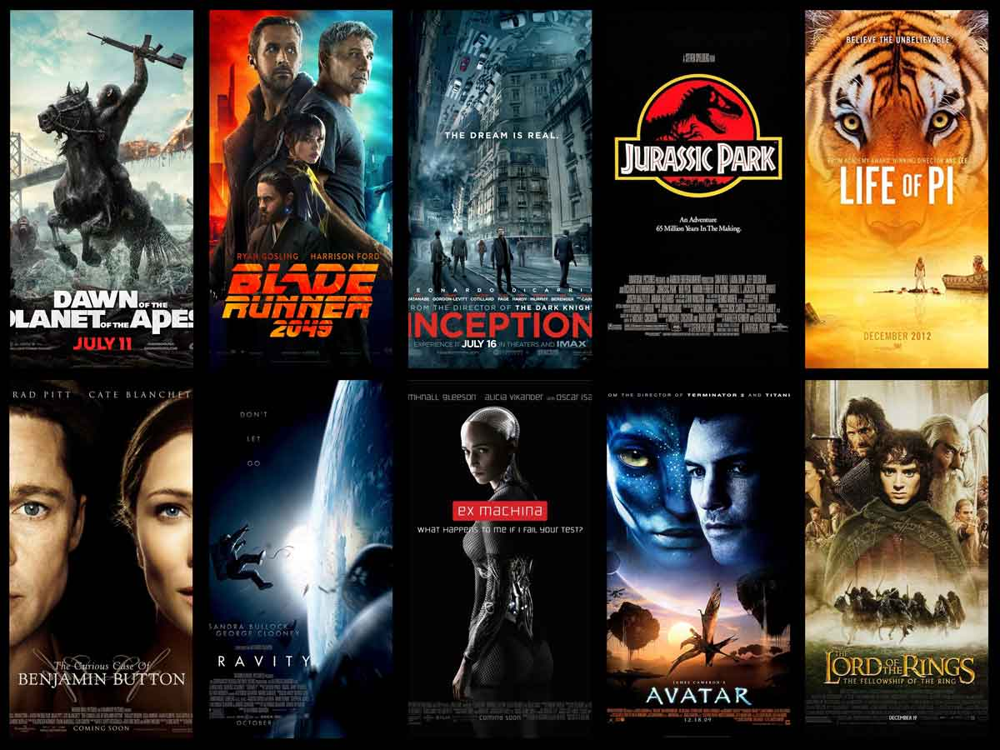

Our first step is to import the excel file into Python, and import pandas to analyze it:

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import pandas as pd

# Read the Excel file into a pandas DataFrame


df = pd.read_excel("/content/drive/MyDrive/ISOM 835/Movies.xlsx")

# Display settings
pd.set_option('display.max_columns', None)

# Preview the data
df

,ID,Movie,Year,Genre,Company,Country,Director,Budget,Gross,Rating,Released,RunTime,Score,Star,Votes,Writer
0,1,Stand by Me,1986,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,8000000,52287414,R,1986-08-22 00:00:00,89,8.1,Wil Wheaton,299174,Stephen King
1,2,Ferris Bueller's Day Off,1986,Comedy,Paramount Pictures,USA,John Hughes,6000000,70136369,PG-13,1986-06-11 00:00:00,103,7.8,Matthew Broderick,264740,John Hughes
2,3,Top Gun,1986,Action,Paramount Pictures,USA,Tony Scott,15000000,179800601,PG,1986-05-16 00:00:00,110,6.9,Tom Cruise,236909,Jim Cash
3,4,Aliens,1986,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,18500000,85160248,R,1986-07-18 00:00:00,137,8.4,Sigourney Weaver,540152,James Cameron
4,5,Flight of the Navigator,1986,Adventure,Walt Disney Pictures,USA,Randal Kleiser,9000000,18564613,PG,1986-08-01 00:00:00,90,6.9,Joey Cramer,36636,Mark H. Baker
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6815,6816,Absolutely Fabulous: The Movie,2016,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,0,4750497,R,2016-07-22 00:00:00,91,5.4,Jennifer Saunders,9161,Jennifer Saunders
6816,6817,Mothers and Daughters,2016,Drama,Siempre Viva Productions,USA,Paul Duddridge,0,28368,PG-13,2016-05-06 00:00:00,90,4.9,Selma Blair,1959,Paige Cameron
6817,6818,Batman: The Killing Joke,2016,Animation,Warner Bros. Animation,USA,Sam Liu,3500000,3775000,R,2016-07-25 00:00:00,76,6.5,Kevin Conroy,36333,Brian Azzarello
6818,6819,The Eyes of My Mother,2016,Drama,Borderline Presents,USA,Nicolas Pesce,0,25981,R,2016-12-02 00:00:00,76,6.2,Kika Magalhães,6947,Nicolas Pesce


Next, we will replace the Index with the ID column, since the pre-set index and ID are repetitive (Now, ID = 1 will be our first row of data, or first movie of the list).

In [20]:
df.set_index("ID", inplace=True)

df

,Movie,Year,Genre,Company,Country,Director,Budget,Gross,Rating,Released,RunTime,Score,Star,Votes,Writer
ID,,,,,,,,,,,,,,,
1,Stand by Me,1986,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,8000000,52287414,R,1986-08-22 00:00:00,89,8.1,Wil Wheaton,299174,Stephen King
2,Ferris Bueller's Day Off,1986,Comedy,Paramount Pictures,USA,John Hughes,6000000,70136369,PG-13,1986-06-11 00:00:00,103,7.8,Matthew Broderick,264740,John Hughes
3,Top Gun,1986,Action,Paramount Pictures,USA,Tony Scott,15000000,179800601,PG,1986-05-16 00:00:00,110,6.9,Tom Cruise,236909,Jim Cash
4,Aliens,1986,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,18500000,85160248,R,1986-07-18 00:00:00,137,8.4,Sigourney Weaver,540152,James Cameron
5,Flight of the Navigator,1986,Adventure,Walt Disney Pictures,USA,Randal Kleiser,9000000,18564613,PG,1986-08-01 00:00:00,90,6.9,Joey Cramer,36636,Mark H. Baker
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6816,Absolutely Fabulous: The Movie,2016,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,0,4750497,R,2016-07-22 00:00:00,91,5.4,Jennifer Saunders,9161,Jennifer Saunders
6817,Mothers and Daughters,2016,Drama,Siempre Viva Productions,USA,Paul Duddridge,0,28368,PG-13,2016-05-06 00:00:00,90,4.9,Selma Blair,1959,Paige Cameron
6818,Batman: The Killing Joke,2016,Animation,Warner Bros. Animation,USA,Sam Liu,3500000,3775000,R,2016-07-25 00:00:00,76,6.5,Kevin Conroy,36333,Brian Azzarello


## Exploring the Data

Used function df.head,df.tail,df.shape and df.info are run to learn more about our dataset. We have 6,820 rows and 15 columns, all of which are data types: object, integers, and floats.

In [7]:
df.shape

(6820, 16)

In [8]:
df.head()

,ID,Movie,Year,Genre,Company,Country,Director,Budget,Gross,Rating,Released,RunTime,Score,Star,Votes,Writer
0,1,Stand by Me,1986,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,8000000,52287414,R,1986-08-22 00:00:00,89,8.1,Wil Wheaton,299174,Stephen King
1,2,Ferris Bueller's Day Off,1986,Comedy,Paramount Pictures,USA,John Hughes,6000000,70136369,PG-13,1986-06-11 00:00:00,103,7.8,Matthew Broderick,264740,John Hughes
2,3,Top Gun,1986,Action,Paramount Pictures,USA,Tony Scott,15000000,179800601,PG,1986-05-16 00:00:00,110,6.9,Tom Cruise,236909,Jim Cash
3,4,Aliens,1986,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,18500000,85160248,R,1986-07-18 00:00:00,137,8.4,Sigourney Weaver,540152,James Cameron
4,5,Flight of the Navigator,1986,Adventure,Walt Disney Pictures,USA,Randal Kleiser,9000000,18564613,PG,1986-08-01 00:00:00,90,6.9,Joey Cramer,36636,Mark H. Baker


In [9]:
df.tail()

,ID,Movie,Year,Genre,Company,Country,Director,Budget,Gross,Rating,Released,RunTime,Score,Star,Votes,Writer
6815,6816,Absolutely Fabulous: The Movie,2016,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,0,4750497,R,2016-07-22 00:00:00,91,5.4,Jennifer Saunders,9161,Jennifer Saunders
6816,6817,Mothers and Daughters,2016,Drama,Siempre Viva Productions,USA,Paul Duddridge,0,28368,PG-13,2016-05-06 00:00:00,90,4.9,Selma Blair,1959,Paige Cameron
6817,6818,Batman: The Killing Joke,2016,Animation,Warner Bros. Animation,USA,Sam Liu,3500000,3775000,R,2016-07-25 00:00:00,76,6.5,Kevin Conroy,36333,Brian Azzarello
6818,6819,The Eyes of My Mother,2016,Drama,Borderline Presents,USA,Nicolas Pesce,0,25981,R,2016-12-02 00:00:00,76,6.2,Kika Magalhães,6947,Nicolas Pesce
6819,6820,From the Land of the Moon,2016,Drama,Les Productions du Trésor,France,Nicole Garcia,0,37757,R,2017-07-28 00:00:00,120,6.7,Marion Cotillard,2411,Milena Agus


In [10]:
df.values

array([[1, 'Stand by Me', 1986, ..., 'Wil Wheaton', 299174,
        'Stephen King'],
       [2, "Ferris Bueller's Day Off", 1986, ..., 'Matthew Broderick',
        264740, 'John Hughes'],
       [3, 'Top Gun', 1986, ..., 'Tom Cruise', 236909, 'Jim Cash'],
       ...,
       [6818, 'Batman: The Killing Joke', 2016, ..., 'Kevin Conroy',
        36333, 'Brian Azzarello'],
       [6819, 'The Eyes of My Mother', 2016, ..., 'Kika Magalhães', 6947,
        'Nicolas Pesce'],
       [6820, 'From the Land of the Moon', 2016, ..., 'Marion Cotillard',
        2411, 'Milena Agus']], dtype=object)

In [19]:
df['Company'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 6820 entries, 0 to 6819
Series name: Company
Non-Null Count  Dtype 
--------------  ----- 
6820 non-null   object
dtypes: object(1)
memory usage: 53.4+ KB


In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6820 entries, 1 to 6820
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Movie     6820 non-null   object 
 1   Year      6820 non-null   int64  
 2   Genre     6820 non-null   object 
 3   Company   6820 non-null   object 
 4   Country   6820 non-null   object 
 5   Director  6820 non-null   object 
 6   Budget    6820 non-null   int64  
 7   Gross     6820 non-null   object 
 8   Rating    6820 non-null   object 
 9   Released  6820 non-null   object 
 10  RunTime   6820 non-null   int64  
 11  Score     6820 non-null   float64
 12  Star      6820 non-null   object 
 13  Votes     6820 non-null   int64  
 14  Writer    6820 non-null   object 
dtypes: float64(1), int64(4), object(10)
memory usage: 852.5+ KB


Creation of variable 'Age', as this will be more straightforward to analyze than 'Year'.

In [ ]:
df['Age'] = 2025 - df['Year']
df.head()

,Movie,Year,Genre,Company,Country,Director,Budget,Gross,Rating,Released,RunTime,Score,Star,Votes,Writer,Age
ID,,,,,,,,,,,,,,,,
1,Stand by Me,1986,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,8000000,52287414,R,1986-08-22 00:00:00,89,8.1,Wil Wheaton,299174,Stephen King,39
2,Ferris Bueller's Day Off,1986,Comedy,Paramount Pictures,USA,John Hughes,6000000,70136369,PG-13,1986-06-11 00:00:00,103,7.8,Matthew Broderick,264740,John Hughes,39
3,Top Gun,1986,Action,Paramount Pictures,USA,Tony Scott,15000000,179800601,PG,1986-05-16 00:00:00,110,6.9,Tom Cruise,236909,Jim Cash,39
4,Aliens,1986,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,18500000,85160248,R,1986-07-18 00:00:00,137,8.4,Sigourney Weaver,540152,James Cameron,39
5,Flight of the Navigator,1986,Adventure,Walt Disney Pictures,USA,Randal Kleiser,9000000,18564613,PG,1986-08-01 00:00:00,90,6.9,Joey Cramer,36636,Mark H. Baker,39


## Creating Target Variable

The target variable for our analysis is "is_profitable", a binary variable we created. It is coded as:
- 1 = Profitable (Gross revenue > Budget)
- 0 = Not profitable (Gross revenue ≤ Budget)

This allows us to analyze which features are most associated with a movie's financial success.

We want to create a target for profitability, and see how the other columns may influence a movie's profitability. To do so, we convert Budget and Gross to numeric values, coerce errors, drop rows with missing values. We create the Target variable safely, defining the output as a binary variable (1 if Gross>Budget, and 0 if Gross<Budget).

In [ ]:
# Convert Budget and Gross to numeric (invalid strings → NaN)
df['Budget'] = pd.to_numeric(df['Budget'], errors='coerce')
df['Gross'] = pd.to_numeric(df['Gross'], errors='coerce')

# Treat 0 as missing
df.loc[df['Budget'] == 0, 'Budget'] = pd.NA
df.loc[df['Gross'] == 0, 'Gross'] = pd.NA

# Check missing values
budget_missing = df['Budget'].isna().sum()
gross_missing = df['Gross'].isna().sum()
total_rows = len(df)
print(f"Missing Budget: {budget_missing} ({budget_missing/total_rows*100:.2f}%)")
print(f"Missing Gross: {gross_missing} ({gross_missing/total_rows*100:.2f}%)")

# Create Target only where Budget and Gross exist
# Use Int64 to allow missing integer values
df['Target'] = (df['Gross'] > df['Budget']).where(
    df['Gross'].notna() & df['Budget'].notna()
).astype('Int64')

# Check that Target respects missing values
print(df[['Budget', 'Gross', 'Target']].head())
print(f"Missing Target values: {df['Target'].isna().sum()}")



Missing Budget: 2182 (31.99%)
Missing Gross: 1 (0.01%)
        Budget        Gross  Target
ID                                 
1    8000000.0   52287414.0       1
2    6000000.0   70136369.0       1
3   15000000.0  179800601.0       1
4   18500000.0   85160248.0       1
5    9000000.0   18564613.0       1
Missing Target values: 2183


## Analyzing Each Column

Our next step is to analyze each column that we think may influence profitability. First we list important variables with details about their type, unit, and relevance to movie profitability. We use a loop for efficiency: the loop automatically analyzes each column in the same way, reducing repetition and ensuring consistent results across all variables. We analyze each column to print the name, data type, and key statistics. We compute the average only for values that are numeric. We exclude 0s in "Budget" column as that is essentially missing data. Lastly, we include justification of why we believe each column is important and relevant to profitability.

In [ ]:
columns_info = {
    "Budget": {"unit": "dollars", "justification": "The budget shows how much money went into making the movie. Usually, bigger budgets mean better effects, well-known actors, and more marketing, which can boost its chances of success."},
    "Gross": {"unit": "dollars", "convert_numeric": True, "note": "Sales Volume Range", "justification": "Gross revenue is the money a movie makes from ticket sales. Since it’s directly tied to profit, using it as a feature would leak the answer, but it is still a variable we need to explore."},
    "Genre": {"unit": "categorical", "categorical": True, "justification": "Genre affects who watches the movie and how well it sells. Some genres draw bigger crowds, while others are more niche, which impacts profitability."},
    "Rating": {"unit": "categorical", "categorical": True, "justification": "Movie ratings (e.g., PG, R) affect who can watch the film and may impact box office performance. Ratings can influence the size and demographics of the audience, thereby affecting profitability."},
    "Year": {"unit": "year", "justification": "The year shows when a movie was released. Movies from different years can perform differently due to changing audience trends and opinions, technology, marketing strategies, and economic conditions."},
    "Age": {"unit": "year", "justification": "The age shows how long ago a movie was released. Movies from different years can perform differently due to changing audience trends and opinions, technology, marketing strategies, and economic conditions."},
    "RunTime": {"unit": "minutes", "justification": "Movie length can affect how many showings fit in a day and how engaged viewers are, which can impact profitability."},
    "Votes": {"unit": "integer", "justification": "The number of votes shows how popular and engaging a movie is. More votes can increase awareness and boost profitability."},
    "Score": {"unit": "float", "justification": "The score shows how audiences or critics perceive the quality of the movie. Movies with higher scores are more likely to attract viewers, get positive word-of-mouth, and generate buzz."},
    "Country": {"unit": "categorical", "categorical": True, "justification": "The country shows where a movie was produced. Different countries may have different audience sizes, production styles, and marketing approaches, which can affect performance."}
}

for col, info in columns_info.items():
    print(f"\nName: {col}")
    print(f"Data Type: {df.dtypes[col]} ({info['unit']})")

    # Handle categorical columns
    if info.get("categorical"):
        counts = df[col].value_counts()
        print("Unique Values and Counts:")
        print(counts)
        if col == "Country":
            print(f"\nNumber of Countries: {df[col].nunique()}")

    # Handle numeric columns
    else:
        # Ignore 0s for Budget only
        subset = df[df[col] != 0] if col == "Budget" else df

        col_min = subset[col].min()
        col_max = subset[col].max()
        col_mean = subset[col].mean()

        label = info.get("note", "Range")
        if info['unit'] == "dollars":
            print(f"{label}: ${col_min:,.2f} - ${col_max:,.2f}")
        else:
            print(f"{label}: {col_min} - {col_max}")

        if not pd.isna(col_mean):
            if info['unit'] in ["minutes", "float", "integer"]:
                print(f"Average: {col_mean:,.2f}")

    print(f"\nJustification: {info['justification']}")
    print("-" * 80)


Name: Budget
Data Type: float64 (dollars)
Range: $6,000.00 - $300,000,000.00

Justification: The budget shows how much money went into making the movie. Usually, bigger budgets mean better effects, well-known actors, and more marketing, which can boost its chances of success.
--------------------------------------------------------------------------------

Name: Gross
Data Type: float64 (dollars)
Sales Volume Range: $70.00 - $936,662,225.00

Justification: Gross revenue is the money a movie makes from ticket sales. Since it’s directly tied to profit, using it as a feature would leak the answer, but it is still a variable we need to explore.
--------------------------------------------------------------------------------

Name: Genre
Data Type: object (categorical)
Unique Values and Counts:
Genre
Comedy       2080
Drama        1444
Action       1331
Crime         522
Adventure     392
Biography     359
Horror        277
Animation     277
Mystery        38
Fantasy        32
Thriller    

# Feature Selection

## Budget :
- Data Type: int64 (dollars)
- Price Range: $6,000 - $300,000,000

Justification: The budget shows how much money went into making the movie. Usually, bigger budgets mean better effects, well-known actors, and more marketing, which can boost its chances of success.
## Gross :
- Data Type: float64 (dollars)
- Sales Volume Range: $70.00 - $936,662,225.00

Justification: Gross revenue is the money a movie makes from ticket sales. Since it’s directly tied to profit, using it as a feature would leak the answer. We want to explore Gross but make sure not use it as a feature since it is directly related to Profit


## Genre :
- Data Type: object (categorical)
- Unique Genres and Counts:

Genre
- Comedy :      2080
- Drama :       1444
- Action :      1331
- Crime  :       521
- Adventure :    392
- Biography :    359
- Horror   :     277
- Animation :    277
- Mystery :        38
- Fantasy  :      32
- Thriller :      18
- Romance :       15
- Family  :       14
- Sci-Fi  :       13
- Musical :        4
- War     :        2
- Western :       2

Name : count, dtype: int64

Justification: Genre affects who watches the movie and how well it sells. Some genres draw bigger crowds, while others are more niche, which impacts profitability.

## Rating :
- Data Type: object (categorical)
- Unique Ratings: R, PG-13, PG, G, NC-17, TV-PG, TV-MA, B, B15, TV-14, NOT RATED/UNRATED/Not specified                  


Justification: Movie ratings (e.g., PG, R) affect who can watch the film and may impact box office performance. Ratings can influence the size and demographics of the audience, thereby affecting profitability.

## Year :
- Data Type: Integer (year)
- Year Range: 1986 - 2016

Justification: The year shows when a movie was released. Movies from different years can perform differently due to changing audience trends and opinions, technology, marketing strategies, and economic conditions. Including the year helps understand how these factors may influence a movie’s profitability.

## Age:
Data Type: int64 (year)
Range: 9 - 39

Justification: The age shows how long ago a movie was released. Movies from different years can perform differently due to changing audience trends and opinions, technology, marketing strategies, and economic conditions. (This is pulled from Year data, as it will be more straightforward to analyze Age than Year. Later we will drop Year from our dataset.)


## RunTime :
- Data Type: int64 (minutes)
- RunTime Range: 50 - 366 minutes
- Average RunTime: 106.55 minutes

Justification: Movie length can affect how many showings fit in a day and how engaged viewers are, which can impact profitability.

## Votes :
- Data Type: int64 (integer)
- Votes Range: 27 - 1,861,666
- Average Votes: 71,222

Justification: The number of votes shows how popular and engaging a movie is. More votes can increase awareness and boost profitability.

## Score :
- Data Type: float64 (float)
- Score Range: 1.5 - 9.3
- Average Score: 6.37

Justification: The score shows how audiences or critics perceive the quality of the movie. Movies with higher scores are more likely to attract viewers, get positive word-of-mouth, and generate buzz. This can lead to higher ticket sales and, ultimately, better profitability.

## Country :
- Data Type: object (categorical)
- Unique Countries Count: 57                          

Name: count, dtype: int64

Justification: The country shows where a movie was produced. Different countries may have different audience sizes, production styles, and marketing approaches, which can affect how well a movie performs financially and its overall profitability.

In [ ]:
df.isna().sum()

Movie          0
Year           0
Genre          0
Company        0
Country        0
Director       0
Budget      2182
Gross          1
Rating         0
Released       0
RunTime        0
Score          0
Star           0
Votes          0
Writer         0
Age            0
Target      2183
dtype: int64

## Splitting the Dataset

We will split our df into a numeric df and categorical df, so we can analyze them separately (and more efficiently). Use df_target for Budget-related calculations because that df contains only valid rows (Budget != 0 and no missing values). Need to do this because 0 isn't a real budget - it is essentially missing or invalid data.

In [ ]:
df.dtypes

Movie        object
Year          int64
Genre        object
Company      object
Country      object
Director     object
Budget      float64
Gross       float64
Rating       object
Released     object
RunTime       int64
Score       float64
Star         object
Votes         int64
Writer       object
Age           int64
Target        Int64
dtype: object

In [ ]:
# Numeric subset
numeric_df = df.select_dtypes(include=['int64', 'float64'])

# Ignore zeros in Budget only for calculations
numeric_df.loc[numeric_df['Budget'] == 0, 'Budget'] = pd.NA

# Since Year and Age are measuring the same thing (collinear), we will drop Year
numeric_df.drop("Year", axis=1, inplace=True, errors='ignore')

numeric_df

,Budget,Gross,RunTime,Score,Votes,Age,Target
ID,,,,,,,
1,8000000.0,52287414.0,89,8.1,299174,39,1
2,6000000.0,70136369.0,103,7.8,264740,39,1
3,15000000.0,179800601.0,110,6.9,236909,39,1
4,18500000.0,85160248.0,137,8.4,540152,39,1
5,9000000.0,18564613.0,90,6.9,36636,39,1
...,...,...,...,...,...,...,...
6816,NaN,4750497.0,91,5.4,9161,9,<NA>
6817,NaN,28368.0,90,4.9,1959,9,<NA>
6818,3500000.0,3775000.0,76,6.5,36333,9,1


In [ ]:
cat_df = df.select_dtypes(include=['object'])

cat_df

,Movie,Genre,Company,Country,Director,Rating,Released,Star,Writer
ID,,,,,,,,,
1,Stand by Me,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,R,1986-08-22 00:00:00,Wil Wheaton,Stephen King
2,Ferris Bueller's Day Off,Comedy,Paramount Pictures,USA,John Hughes,PG-13,1986-06-11 00:00:00,Matthew Broderick,John Hughes
3,Top Gun,Action,Paramount Pictures,USA,Tony Scott,PG,1986-05-16 00:00:00,Tom Cruise,Jim Cash
4,Aliens,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,R,1986-07-18 00:00:00,Sigourney Weaver,James Cameron
5,Flight of the Navigator,Adventure,Walt Disney Pictures,USA,Randal Kleiser,PG,1986-08-01 00:00:00,Joey Cramer,Mark H. Baker
...,...,...,...,...,...,...,...,...,...
6816,Absolutely Fabulous: The Movie,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,R,2016-07-22 00:00:00,Jennifer Saunders,Jennifer Saunders
6817,Mothers and Daughters,Drama,Siempre Viva Productions,USA,Paul Duddridge,PG-13,2016-05-06 00:00:00,Selma Blair,Paige Cameron
6818,Batman: The Killing Joke,Animation,Warner Bros. Animation,USA,Sam Liu,R,2016-07-25 00:00:00,Kevin Conroy,Brian Azzarello


## Move the dummy variable
("Target" is binary data) so we will move it to our cat_df as well:

In [ ]:
cat_df = df.select_dtypes(include=['object'])

cat_df

,Movie,Genre,Company,Country,Director,Rating,Released,Star,Writer
ID,,,,,,,,,
1,Stand by Me,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,R,1986-08-22 00:00:00,Wil Wheaton,Stephen King
2,Ferris Bueller's Day Off,Comedy,Paramount Pictures,USA,John Hughes,PG-13,1986-06-11 00:00:00,Matthew Broderick,John Hughes
3,Top Gun,Action,Paramount Pictures,USA,Tony Scott,PG,1986-05-16 00:00:00,Tom Cruise,Jim Cash
4,Aliens,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,R,1986-07-18 00:00:00,Sigourney Weaver,James Cameron
5,Flight of the Navigator,Adventure,Walt Disney Pictures,USA,Randal Kleiser,PG,1986-08-01 00:00:00,Joey Cramer,Mark H. Baker
...,...,...,...,...,...,...,...,...,...
6816,Absolutely Fabulous: The Movie,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,R,2016-07-22 00:00:00,Jennifer Saunders,Jennifer Saunders
6817,Mothers and Daughters,Drama,Siempre Viva Productions,USA,Paul Duddridge,PG-13,2016-05-06 00:00:00,Selma Blair,Paige Cameron
6818,Batman: The Killing Joke,Animation,Warner Bros. Animation,USA,Sam Liu,R,2016-07-25 00:00:00,Kevin Conroy,Brian Azzarello


In [ ]:
cat_df = pd.concat([cat_df, df["Target"]], axis=1)

cat_df

,Movie,Genre,Company,Country,Director,Rating,Released,Star,Writer,Target
ID,,,,,,,,,,
1,Stand by Me,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,R,1986-08-22 00:00:00,Wil Wheaton,Stephen King,1
2,Ferris Bueller's Day Off,Comedy,Paramount Pictures,USA,John Hughes,PG-13,1986-06-11 00:00:00,Matthew Broderick,John Hughes,1
3,Top Gun,Action,Paramount Pictures,USA,Tony Scott,PG,1986-05-16 00:00:00,Tom Cruise,Jim Cash,1
4,Aliens,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,R,1986-07-18 00:00:00,Sigourney Weaver,James Cameron,1
5,Flight of the Navigator,Adventure,Walt Disney Pictures,USA,Randal Kleiser,PG,1986-08-01 00:00:00,Joey Cramer,Mark H. Baker,1
...,...,...,...,...,...,...,...,...,...,...
6816,Absolutely Fabulous: The Movie,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,R,2016-07-22 00:00:00,Jennifer Saunders,Jennifer Saunders,<NA>
6817,Mothers and Daughters,Drama,Siempre Viva Productions,USA,Paul Duddridge,PG-13,2016-05-06 00:00:00,Selma Blair,Paige Cameron,<NA>
6818,Batman: The Killing Joke,Animation,Warner Bros. Animation,USA,Sam Liu,R,2016-07-25 00:00:00,Kevin Conroy,Brian Azzarello,1


In [ ]:
numeric_df.drop("Target", axis=1, inplace=True, errors='ignore')

numeric_df

,Budget,Gross,RunTime,Score,Votes,Age
ID,,,,,,
1,8000000.0,52287414.0,89,8.1,299174,39
2,6000000.0,70136369.0,103,7.8,264740,39
3,15000000.0,179800601.0,110,6.9,236909,39
4,18500000.0,85160248.0,137,8.4,540152,39
5,9000000.0,18564613.0,90,6.9,36636,39
...,...,...,...,...,...,...
6816,NaN,4750497.0,91,5.4,9161,9
6817,NaN,28368.0,90,4.9,1959,9
6818,3500000.0,3775000.0,76,6.5,36333,9


# Descriptive Statistics

For our numeric data, we will compute descriptive statistics: count, mean, standard deviation, min, max, and percentiles.

In [ ]:
numeric_df.describe(percentiles=[0.10,0.25,0.5,0.75,0.90]).round(1)

,Budget,Gross,RunTime,Score,Votes,Age
count,4638.0,6819.0,6820.0,6820.0,6820.0,6820.0
mean,36145601.6,33501476.8,106.6,6.4,71219.5,24.0
std,39969473.3,58201089.9,18.0,1.0,130517.6,8.9
min,6000.0,70.0,50.0,1.5,27.0,9.0
10%,4000000.0,194633.4,89.0,5.1,2583.9,12.0
25%,10000000.0,1515264.0,95.0,5.8,7665.2,16.0
50%,23000000.0,12136938.0,102.0,6.4,25892.5,24.0
75%,46000000.0,40065726.0,115.0,7.1,75812.2,32.0
90%,85000000.0,90307002.0,128.0,7.6,186972.0,36.0
max,300000000.0,936662225.0,366.0,9.3,1861666.0,39.0


### **Coefficient of Variation = CV**
We want to compute the coefficient of varation to further understand our numeric data, and add this to our descriptive statistics.

CV = (std/mean)* 100

CV measures relative variability, or how much the data varies in proportion to its mean. Higher CV means the data is more spread out and less consistent. Lower CV means data is more stable or uniform. CV is useful for comparing variability across datasets with different units or scales.

For the purpose of this study, we will define:

**Low variation**: Under 25%

**Moderate variation**: 25-99%

**High variation**: 100%+

In [ ]:
numeric_df.std()

Budget     3.996947e+07
Gross      5.820109e+07
RunTime    1.802818e+01
Score      1.003142e+00
Votes      1.305176e+05
Age        8.944501e+00
dtype: float64

In [ ]:
numeric_df.mean()

Budget     3.614560e+07
Gross      3.350148e+07
RunTime    1.065513e+02
Score      6.374897e+00
Votes      7.121952e+04
Age        2.399971e+01
dtype: float64

In [ ]:
cv = ((numeric_df.std()/numeric_df.mean())).round(2) * 100

cv

Budget     111.0
Gross      174.0
RunTime     17.0
Score       16.0
Votes      183.0
Age         37.0
dtype: float64

### Skewness & Kurtosis

We want to compute the skewness and kurtosis to further understand our numeric data, and add this to our descriptive statistics.

**Skewness** tells us how symmetric or lopsided a distribution is around its mean. Positive skew (>0) means the right tail is longer. Negative skew (<0) tells us the left tail is longer. Skew around 0 means the curve is symmetric.

**Kurtosis** measures how heavy or light the tails of the distribution are compared to a normal curve (how extreme the outliers are). High kurtosis (>3) means heavy tails and more extreme outliers. Low kurtosis (<3) means light tails; fewer outliers and a flatter distribution. Kurtosis = 3 means the data is a normal bell-shaped distribution.

In [ ]:
skew = numeric_df.skew()

skew

Budget     2.252282
Gross      4.174816
RunTime    2.397354
Score     -0.634930
Votes      4.800595
Age       -0.000110
dtype: float64

In [ ]:
kurt = numeric_df.kurt()

kurt

Budget      6.085001
Gross      28.978446
RunTime    17.287144
Score       0.925299
Votes      35.290031
Age        -1.202564
dtype: float64

## Missing Data

We check how many missing values exist for each column. Then we store it into new variable called "missing." Budget contains 2182 rows (recorded as '0'.) Gross contains 1 non=numeric after coercion.

In [ ]:
numeric_df.isnull().sum()

Budget     2182
Gross         1
RunTime       0
Score         0
Votes         0
Age           0
dtype: int64

In [ ]:
missing = numeric_df.isnull().sum()

## Creating the Table

Now, we add our additional statistics (CV, skew, kurtosis, and missing data) to our original base df to have a full picture of our descriptive stats for numeric df:

In [ ]:
base = numeric_df.describe(percentiles=[0.10,0.25,0.5,0.75,0.90]).round(1)

base

,Budget,Gross,RunTime,Score,Votes,Age
count,4638.0,6819.0,6820.0,6820.0,6820.0,6820.0
mean,36145601.6,33501476.8,106.6,6.4,71219.5,24.0
std,39969473.3,58201089.9,18.0,1.0,130517.6,8.9
min,6000.0,70.0,50.0,1.5,27.0,9.0
10%,4000000.0,194633.4,89.0,5.1,2583.9,12.0
25%,10000000.0,1515264.0,95.0,5.8,7665.2,16.0
50%,23000000.0,12136938.0,102.0,6.4,25892.5,24.0
75%,46000000.0,40065726.0,115.0,7.1,75812.2,32.0
90%,85000000.0,90307002.0,128.0,7.6,186972.0,36.0
max,300000000.0,936662225.0,366.0,9.3,1861666.0,39.0


In [ ]:
extra_stats = pd.DataFrame({
    'CV' : cv,
    'Skew': skew,
    'Kurtosis': kurt,
    'Missing': missing,
}).round(1).T

extra_stats

,Budget,Gross,RunTime,Score,Votes,Age
CV,111.0,174.0,17.0,16.0,183.0,37.0
Skew,2.3,4.2,2.4,-0.6,4.8,-0.0
Kurtosis,6.1,29.0,17.3,0.9,35.3,-1.2
Missing,2182.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
descriptives = pd.concat([base, extra_stats])

descriptives

,Budget,Gross,RunTime,Score,Votes,Age
count,4638.0,6819.0,6820.0,6820.0,6820.0,6820.0
mean,36145601.6,33501476.8,106.6,6.4,71219.5,24.0
std,39969473.3,58201089.9,18.0,1.0,130517.6,8.9
min,6000.0,70.0,50.0,1.5,27.0,9.0
10%,4000000.0,194633.4,89.0,5.1,2583.9,12.0
25%,10000000.0,1515264.0,95.0,5.8,7665.2,16.0
50%,23000000.0,12136938.0,102.0,6.4,25892.5,24.0
75%,46000000.0,40065726.0,115.0,7.1,75812.2,32.0
90%,85000000.0,90307002.0,128.0,7.6,186972.0,36.0
max,300000000.0,936662225.0,366.0,9.3,1861666.0,39.0


## Categorical Columns: Create bar charts and value counts:

Display value counts to better understand data. Bar charts to visualize data: only create bar charts for Genre, Rating, and Target, as the remaining categorical columns have too many unique values to illustrate effectively in a plot (e.g. unique movie names, directors). We display counts (top 10) for all columns besides ones that have too many unique variables (e.g. Name, Director, Star, Writer).


Top 10 Value Counts for Categorical Columns of Interest

Column: Company
-----------------
                                        Count  Percent
Company                                               
Universal Pictures                        302     4.43
Warner Bros.                              294     4.31
Paramount Pictures                        259     3.80
Twentieth Century Fox Film Corporation    205     3.01
New Line Cinema                           172     2.52
Columbia Pictures Corporation             166     2.43
Touchstone Pictures                       131     1.92
Columbia Pictures                         108     1.58
Walt Disney Pictures                      102     1.50
Metro-Goldwyn-Mayer (MGM)                 101     1.48

Column: Country
-----------------
           Count  Percent
Country                  
USA         4872    71.44
UK           698    10.23
France       283     4.15
Canada       150     2.20
Germany      134     1.96
Australia     82     1.20
Japan

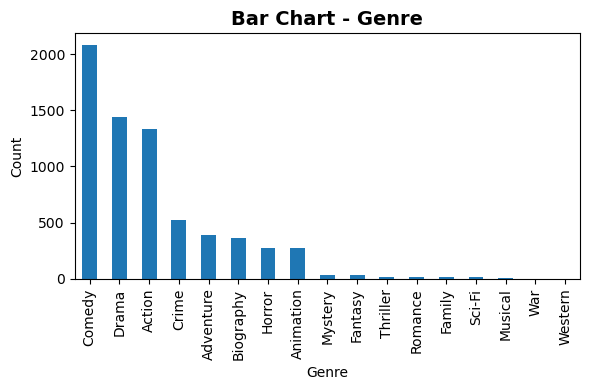


 Column: Rating
----------------
               Count  Percent
Rating                       
R               3392    49.74
PG-13           1995    29.25
PG               951    13.94
NOT RATED        174     2.55
G                147     2.16
UNRATED           71     1.04
Not specified     63     0.92
NC-17             22     0.32
TV-PG              1     0.01
TV-MA              1     0.01
B                  1     0.01
B15                1     0.01
TV-14              1     0.01


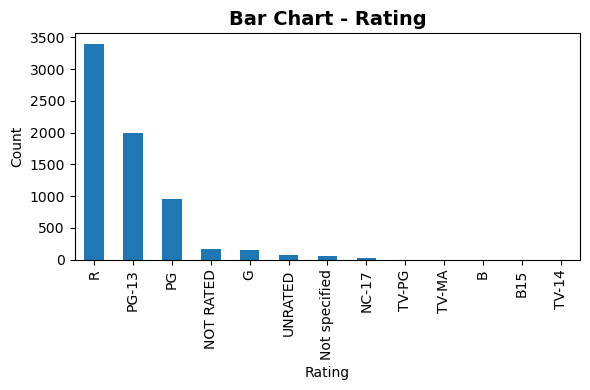


 Column: Target
----------------
        Count  Percent
Target                
0        2359    34.59
1        2278     33.4
<NA>     2183    32.01


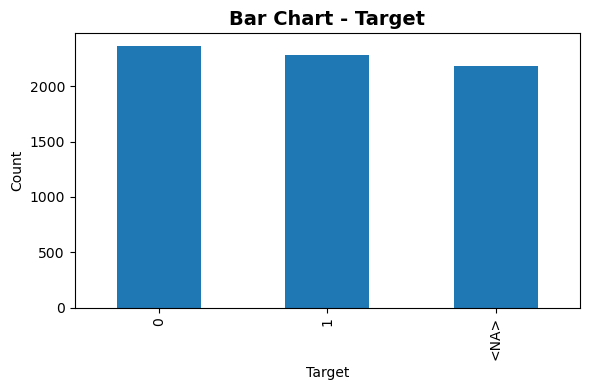

In [ ]:
import matplotlib.pyplot as plt

# Columns for which we want bar charts
cols_to_check = ["Genre", "Rating", "Target"]

# Value Counts (Top 10) for categorical columns of interest
print("\nTop 10 Value Counts for Categorical Columns of Interest")

cols_to_count = ["Company", "Country", "Released"]

for col in cols_to_count:
    print(f"\nColumn: {col}")
    print("-" * (len(col) + 10))

    counts = cat_df[col].value_counts(dropna=False).head(10)
    percents = cat_df[col].value_counts(normalize=True, dropna=False).head(10) * 100

    summary = pd.DataFrame({
        "Count": counts,
        "Percent": percents.round(2)
    })
    print(summary.to_string())

# Bar charts for selected columns ---
for col in cols_to_check:
    print(f"\n Column: {col}")
    print("-" * (len(col) + 10))

    counts = cat_df[col].value_counts(dropna=False)
    percents = cat_df[col].value_counts(normalize=True, dropna=False) * 100

    summary = pd.DataFrame({"Count": counts, "Percent": percents.round(2)})
    print(summary.to_string())

    # --- BAR CHART ---
    plt.figure(figsize=(6,4))
    counts.plot(kind="bar")
    plt.title(f"Bar Chart - {col}", fontsize=14, fontweight="bold")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks()
    plt.tight_layout()
    plt.show()

In [25]:
df.columns

Index(['Movie', 'Year', 'Genre', 'Company', 'Country', 'Director', 'Budget',
       'Gross', 'Rating', 'Released', 'RunTime', 'Score', 'Star', 'Votes',
       'Writer'],
      dtype='object')

### Create clean output of numeric data columns (name, data type, and range of values):

In [ ]:
for col in numeric_df:
    print(f"\nName: {col}")

    # Get the data type
    col_type = df.dtypes[col]
    print(f"Data Type: {col_type}")

    # Compute min & max, excluding zeros
    col_min = df[df[col] != 0][col].min()
    col_max = df[col].max()

    # Format depending on category and units
    if col in ["Budget", "Gross"]:
      print(f"Range: ${col_min:,.0f} - ${col_max:,.0f}")
    elif col in ["RunTime"]:
      print(f"Range: {col_min:,.0f} - {col_max:,.0f} minutes")
    elif col in ["Score"]:
      print(f"Range: {col_min:,.1f} - {col_max:,.1f}")
    else:
      print(f"Range: {col_min:,.0f} - {col_max:,.0f}")

    print("-" * 40)


Name: Budget
Data Type: float64
Range: $6,000 - $300,000,000
----------------------------------------

Name: Gross
Data Type: float64
Range: $70 - $936,662,225
----------------------------------------

Name: RunTime
Data Type: int64
Range: 50 - 366 minutes
----------------------------------------

Name: Score
Data Type: float64
Range: 1.5 - 9.3
----------------------------------------

Name: Votes
Data Type: int64
Range: 27 - 1,861,666
----------------------------------------

Name: Age
Data Type: int64
Range: 9 - 39
----------------------------------------


# Key Findings

# Numeric Data Findings:

### Year:
Mean and median: both around 2001. Dataset is centered on early 2000s movies.
Range: spans 30 years.
CV=0: Essentially no variability in terms of relative spread.
Skew and kurtosis: Both are near 0, indicating a fairly uniform and symmetric distribution.

*We have a long time span. Movies are evenly spread throughout the years. This is a good base for analyzing trends over time.*

### Age:
Mean and median: Mean and median are both 24 years.
Range: 9-39 years.
CV=37%: Moderate variability in terms of relative spread.
Skew and kurtosis: Skew is 0, there is no skew and data is symmetric. Kurtosis is -1.2, indicating a slightly flatter peak and lighter tail.

*Movies are not very old. This is a good base for analyzing trends over time.*

### Budget:
We have a large range of $6,000 to $300M, with an average of ~$36M. CV (111%) is very high, and we see large variation in a strong right skew (2.3). This means that most movies have smaller budgets but there are a few big blockbusters that heavily inflate the average. Kurtosis (6.1) means the distribution has heavy tails: lots of outliers on both sides (very low budgets and very high budgets). There are 2,182 missing values, where budget was not reported.

### Gross:
Gross revenue ranges from $70 million to $936 million, averaging $33.5 million. Like the budget, it’s highly uneven (skewness = 4.2, kurtosis = 29.0) most films earn modestly, while a few major hits dominate. The high CV of 174% shows large variation in box office results.


### Runtime:
Runtime averages ~107 minutes. A moderate skew of 2.4 and kurtosis of 17.3 suggest a few unusually long films pull the average slightly upward.

### Score:
Scores range from 1.5 to 9.3, averaging 6.4. This is roughly a normal, bell shaped distribution (skew 0.6, kurtosis 0.9). The CV of 16% shows low variation - ratings are fairly consistent most films are near the 6–7 range.

### Votes:
Votes range from 27 to 1.86 million, with an average of ~71,000 votes. Very high CV (183%), extreme skew (4.8), and huge kurtosis (35.3) show that a few very popular movies get vastly more engagement than the rest. Most films have relatively few votes.

## Key Numeric Findings
- Data is heavily skewed right, especially in terms of financial metrics, meaning small amount of  blockbuster movies dominate.
- Budgets and gross revenue show the strongest variability and outlier behavior.
- Scores and runtimes show the most stability, usually being centered around typical industry ranges.
- Missing data mainly affects the Budget column,which is why it is filtered out for calculations.




## Categorical Data Findings:

###Genre:
Our data is dominated by a few genres which together represent 70% of films for our entire dataset: Comedy makes up 30.5%, Drama 21.2%, and action 19.5%. Niche genres are underrepresented. Genre likely plays a major role in profitability. For example, action and animation tend to have higher budgets and more international appeal, whereas dramas and comedies may be cheaper but have lower returns. Genre is worth exploring.
###Company:
The top 10 studios make up a significant share of total movies with Warner Bros, Universal, and Paramount together accounting for around 12% of all films. Independent studios are fragmented after this top 10. There is a long tail of smaller, independent or one-off production companies. The profitability varies strongly depending on whether a movie is being produced by a major studio compared to an independent one. This will be worth looking into more later!
###Country:
The data shows an overwhelming US film dominance. In fact, 71% of all films are from the US, followed by 10% from the UK, and 4% from France. There’s a smaller representation of Asian markets with Japan at just 1%, and even less from other non-English-speaking markets. This data reveals that countries may capture regional production styles as well as market access. The heavily US-centric dataset could have a slight bias toward Hollywood-style practices rather than representing global patterns.
###Rating:
R-rated (50%) and PG-13 (29%) films dominate, with nearly 80% of all movies. Family-friendly ratings (PG and G) make up only 16%, and rare cases like “NC-17” or TV ratings suggest misclassification or non-theatrical releases. Ratings appear linked to audience reach; R-rated films target smaller audiences but see higher engagement, while PG/PG-13 films may have wider mass box office appeal.
###Released:
There’s a data quality issue with about 1% of entries showing “#NULL!” placeholders for missing values. Release dates don’t show meaningful clustering, which suggests duplicates are likely coincidental. It may be useful to extract release month (since Year is already a numerical column) to analyze seasonal profitability trends, such as summer blockbusters versus winter releases.
###Target:
We see that the dataset is somewhat imbalanced, but not severely split; it is still good for predictive modeling.
65% profitable (1)
35% not profitable (0)
The majority of films turn a profit, but a substantial minority don’t. This makes target classification meaningful and non-trivial.
###Key Categorical Findings:
- Dataset is dominated by US-made, major-studio, mainstream genre films
PG-13 and R ratings dominate
- Genre, Rating, Company are likely to show the strongest categorical influence on profitability
- Released column can be further broken down (into month) for more useful data. Currently there are a number of missing data and there is no strong clustering.
- Country may act as an indication for production scale or international reach capabilities


In [ ]:
cat_df.shape

(6820, 10)

In [ ]:
numeric_df.shape

(6820, 6)

## Creating New Features: Dealing with Categorical Data

**Release Quarter**

We will use our Released data to extract the month of release. From there we can determine quarter (Season) to examine how the season a movie is released relates to our target (profitability). We see here that < 1% of Released data is missing. Later we will drop these rows (listwise deletion) with minimal impact.

In [ ]:
# Create Release Month & Quarter Variables
df['Released'] = pd.to_datetime(df['Released'], errors='coerce')
df['Release_Month'] = df['Released'].dt.month
df['Release_Quarter'] = df['Released'].dt.quarter

# Explore missingness
print(df['Released'].isna().mean() * 100)

0.9384164222873901


In [ ]:
df

,Movie,Year,Genre,Company,Country,Director,Budget,Gross,Rating,Released,RunTime,Score,Star,Votes,Writer,Age,Target,Release_Month,Release_Quarter
ID,,,,,,,,,,,,,,,,,,,
1,Stand by Me,1986,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,8000000.0,52287414.0,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,39,1,8.0,3.0
2,Ferris Bueller's Day Off,1986,Comedy,Paramount Pictures,USA,John Hughes,6000000.0,70136369.0,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,39,1,6.0,2.0
3,Top Gun,1986,Action,Paramount Pictures,USA,Tony Scott,15000000.0,179800601.0,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,39,1,5.0,2.0
4,Aliens,1986,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,18500000.0,85160248.0,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,39,1,7.0,3.0
5,Flight of the Navigator,1986,Adventure,Walt Disney Pictures,USA,Randal Kleiser,9000000.0,18564613.0,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,39,1,8.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6816,Absolutely Fabulous: The Movie,2016,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,NaN,4750497.0,R,2016-07-22,91,5.4,Jennifer Saunders,9161,Jennifer Saunders,9,<NA>,7.0,3.0
6817,Mothers and Daughters,2016,Drama,Siempre Viva Productions,USA,Paul Duddridge,NaN,28368.0,PG-13,2016-05-06,90,4.9,Selma Blair,1959,Paige Cameron,9,<NA>,5.0,2.0
6818,Batman: The Killing Joke,2016,Animation,Warner Bros. Animation,USA,Sam Liu,3500000.0,3775000.0,R,2016-07-25,76,6.5,Kevin Conroy,36333,Brian Azzarello,9,1,7.0,3.0


**Movie Word Count**

We will create another feature Movie_Word_Count to see if length of movie title (# of words) is related to blockbuster hits with high profitability. For example, movie names like 'It' or 'Up' might indicate marketing strategy for blockbusters, whereas long titles may indicate niche or international films.

First we make sure all values under Movie are string data and that there is no missing data. Then we create new variables **Movie_Title_Length** and **Movie_Word_Count**. We believe Movie_Word_Count will be more interpretable so we will keep that one as a variable to analyze.

In [ ]:
# How many unique movie titles
cat_df['Movie'].nunique()

6731

In [ ]:
cat_df['Movie'].value_counts()

Movie
Pulse                              3
Hamlet                             3
The Girl with the Dragon Tattoo    2
Passengers                         2
Death at a Funeral                 2
                                  ..
Absolutely Fabulous: The Movie     1
Mothers and Daughters              1
Batman: The Killing Joke           1
The Eyes of My Mother              1
The Fly                            1
Name: count, Length: 6731, dtype: int64

In [ ]:
cat_df['Movie'].isna().sum()

np.int64(0)

In [ ]:
cat_df.dtypes

Movie       object
Genre       object
Company     object
Country     object
Director    object
Rating      object
Released    object
Star        object
Writer      object
Target       Int64
dtype: object

In [ ]:
cat_df['Movie'].apply(lambda x: isinstance(x, str)).all()

np.True_

In [ ]:
# Create new variable Movie_Word_Count
df['Movie_Title_Length'] = df['Movie'].str.len()
df['Movie_Word_Count'] = df['Movie'].str.split().str.len()

# Explore missingness
print(df['Movie'].isna().mean() * 100)

0.0


In [ ]:
df

,Movie,Year,Genre,Company,Country,Director,Budget,Gross,Rating,Released,RunTime,Score,Star,Votes,Writer,Age,Target,Release_Month,Release_Quarter,Movie_Title_Length,Movie_Word_Count
ID,,,,,,,,,,,,,,,,,,,,,
1,Stand by Me,1986,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,8000000.0,52287414.0,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,39,1,8.0,3.0,11,3
2,Ferris Bueller's Day Off,1986,Comedy,Paramount Pictures,USA,John Hughes,6000000.0,70136369.0,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,39,1,6.0,2.0,24,4
3,Top Gun,1986,Action,Paramount Pictures,USA,Tony Scott,15000000.0,179800601.0,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,39,1,5.0,2.0,7,2
4,Aliens,1986,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,18500000.0,85160248.0,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,39,1,7.0,3.0,6,1
5,Flight of the Navigator,1986,Adventure,Walt Disney Pictures,USA,Randal Kleiser,9000000.0,18564613.0,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,39,1,8.0,3.0,23,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6816,Absolutely Fabulous: The Movie,2016,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,NaN,4750497.0,R,2016-07-22,91,5.4,Jennifer Saunders,9161,Jennifer Saunders,9,<NA>,7.0,3.0,30,4
6817,Mothers and Daughters,2016,Drama,Siempre Viva Productions,USA,Paul Duddridge,NaN,28368.0,PG-13,2016-05-06,90,4.9,Selma Blair,1959,Paige Cameron,9,<NA>,5.0,2.0,21,3
6818,Batman: The Killing Joke,2016,Animation,Warner Bros. Animation,USA,Sam Liu,3500000.0,3775000.0,R,2016-07-25,76,6.5,Kevin Conroy,36333,Brian Azzarello,9,1,7.0,3.0,24,4


## Dealing with Categorical Data: Existing Features

**Star**

We see that our top stars appear 33-42 movies, whereas our bottom stars appear in 1 movie. This is a long-tail distribtion with a few very well-represented stars and the vast majority only appear once. We will choose a threshold keeping in mind that we want at least 10-20 observations per level to obtain a stable coefficient of regression, and we want to capture 0.2-0.5 of the dataset. With that, we select a threshold of 20 movies.

We create a binary feature:

**Is_TopStar**
(1) if the lead star appears in >= 20 movies, and is (0) if they do not.

Our aim is to see whether havin a top star brings in more profitability.

In [ ]:
df['Star'].value_counts()

Star
Nicolas Cage         42
Robert De Niro       38
Denzel Washington    36
Tom Hanks            35
Bruce Willis         33
                     ..
Jamie Dornan          1
Joe Alwyn             1
Aaron Poole           1
Jacob Latimore        1
Jun Kunimura          1
Name: count, Length: 2504, dtype: int64

In [ ]:
star_counts = df['Star'].value_counts()

# Define threshold (appears in 20 movies)
threshold = 20

# Get stars who meet the threshold
top_star_list = star_counts[star_counts >= threshold].index.tolist()

# Create binary indicator
df['Is_TopStar'] = df['Star'].isin(top_star_list).astype(int)

**Genre**

We see that our top genres fall within Comedy, Drama, and Action, but we felt that including the top 8 categories would tell a fuller story. We map these top 8 genres with value counts 4% and above (whereas the remaining individual categories only make up 0.56% or less). We group the remaining small categories into "9" so that we can create dummies and perform one-hot encoding later. We want to see how/whether each individual genre relates to profitability.

**Top_Genre** Mapping:

    'Comedy': 1,
    'Drama': 2,
    'Action': 3,
    'Crime': 4,
    'Adventure': 5,
    'Biography': 6,
    'Animation': 7,
    'Horror': 8,
    'Other': 9

In [ ]:
df['Genre'].value_counts(normalize=True)*100

Genre
Comedy       30.498534
Drama        21.173021
Action       19.516129
Crime         7.653959
Adventure     5.747801
Biography     5.263930
Horror        4.061584
Animation     4.061584
Mystery       0.557185
Fantasy       0.469208
Thriller      0.263930
Romance       0.219941
Family        0.205279
Sci-Fi        0.190616
Musical       0.058651
War           0.029326
Western       0.029326
Name: proportion, dtype: float64

In [ ]:
top_genre = {
    'Comedy': 1,
    'Drama': 2,
    'Action': 3,
    'Crime': 4,
    'Adventure': 5,
    'Biography': 6,
    'Animation': 7,
    'Horror': 8
}

df['Top_Genre'] = df['Genre'].apply(
    lambda x: top_genre[x] if x in top_genre else 9
)

**Country**

We see that the majority of our data falls under USA, UK, and France. We decide to take a similar approach, creating a category for USA, UK, France, and the remainder in Other. Later we will create dummies and perform one-hot encoding on this exhaustive list. We want to know whether a movie is produced in one of these top 3 countries has an effect on profitability.

**Top_Country** Mapping:

    'USA': 1,
    'UK': 2,
    'France': 3
    'Other': 4

In [ ]:
df['Country'].value_counts(normalize=True)

Country
USA                               0.714370
UK                                0.102346
France                            0.041496
Canada                            0.021994
Germany                           0.019648
Australia                         0.012023
Japan                             0.009971
Spain                             0.008211
Italy                             0.007478
Ireland                           0.006452
Hong Kong                         0.005718
India                             0.005718
Denmark                           0.004839
China                             0.003519
South Korea                       0.002933
New Zealand                       0.002639
Sweden                            0.002639
Belgium                           0.002639
Mexico                            0.002199
Argentina                         0.001906
Netherlands                       0.001760
Iran                              0.001760
Russia                            0.001466
Sou

In [ ]:
top_country = {
    'USA': 1,
    'UK': 2,
    'France': 3
}

df['Top_Country'] = df['Country'].apply(lambda x: top_country[x] if x in top_country else 4)

**Company**

We see that our dataset includes hundreds of production companies, but only a handful appear frequently. We want to focus on meaningful signal, so top companies (e.g. Universal, Warner Bros., Columbia, Disney) are more likely to influence box office outcomes or audience interest. We decided to create the following binary variable to feed into our model:

**Is_TopCompany**
(1) if the movie was produced by a "top 10" company and (0) if it was not produced by a "top 10" company.

In [ ]:
print(df['Company'].value_counts(normalize=True).head(10))
print(df['Company'].value_counts(normalize=True).tail(5))

Company
Universal Pictures                        0.044282
Warner Bros.                              0.043109
Paramount Pictures                        0.037977
Twentieth Century Fox Film Corporation    0.030059
New Line Cinema                           0.025220
Columbia Pictures Corporation             0.024340
Touchstone Pictures                       0.019208
Columbia Pictures                         0.015836
Walt Disney Pictures                      0.014956
Metro-Goldwyn-Mayer (MGM)                 0.014809
Name: proportion, dtype: float64
Company
Chartoff-Winkler Productions    0.000147
Panorama Films                  0.000147
Prima Linea Productions         0.000147
Jay Weston Productions          0.000147
Sketch Films                    0.000147
Name: proportion, dtype: float64


In [ ]:
top_company_list = [
    'Universal Pictures',
    'Warner Bros.',
    'Paramount Pictures',
    'Twentieth Century Fox Film Corporation',
    'New Line Cinema',
    'Columbia Pictures Corporation',
    'Touchstone Pictures',
    'Columbia Pictures',
    'Walt Disney Pictures',
    'Metro-Goldwyn-Mayer (MGM)'
]

# Create binary variable
df['Is_TopCompany'] = df['Company'].isin(top_company_list).astype(int)


**Rating**

We see that about 80% (!) of our dataset falls under ratings R or PG-13. We are curious to find out whether a movie with a restricted audience aids or deters from profitability. E.g. Does a rated R movie gain less earnings/profitability because it deters younger audiences and families? Or does it have the opposite effect?

We decide to create two binary features to feed into our model. We do not need a third variable "other" because we can generalize that anything that does not fall into either R or PG-13 is then geared toward the general audience.

**Is_R**
(1) The movie's rating is "R" - Ages 18+ and (0) If the movie's rating is not "R"

**Is_PG-13**
(1) The movie's rating is "PG-13" - Ages 13+ and (0) The movie's rating is not "PG-13"

In [ ]:
df['Rating'].value_counts(normalize=True)*100

Rating
R                49.736070
PG-13            29.252199
PG               13.944282
NOT RATED         2.551320
G                 2.155425
UNRATED           1.041056
Not specified     0.923754
NC-17             0.322581
TV-PG             0.014663
TV-MA             0.014663
B                 0.014663
B15               0.014663
TV-14             0.014663
Name: proportion, dtype: float64

In [ ]:
# We will create two binary features for movie ratings R and PG-13. We will assume that everything else falls under the General audience.

df['Is_R'] = (df['Rating'] == 'R').astype(int)
df['Is_PG13'] = (df['Rating'] == 'PG-13').astype(int)

**Cleaning Data**

<1% of data in Release_Quarter is missing so we will use listwise deletion. We want to do this now before our one-hot encoding process.

In [ ]:
print(df['Released'].isna().value_counts(normalize=True)*100)

#Drop rows where Released is NaT
df = df[df['Released'].notna()]

df

Released
False    99.061584
True      0.938416
Name: proportion, dtype: float64


,Movie,Year,Genre,Company,Country,Director,Budget,Gross,Rating,Released,RunTime,Score,Star,Votes,Writer,Age,Target,Release_Month,Release_Quarter,Movie_Title_Length,Movie_Word_Count,Is_TopStar,Top_Genre,Top_Country,Is_TopCompany,Is_R,Is_PG13
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,Stand by Me,1986,Adventure,Columbia Pictures Corporation,USA,Rob Reiner,8000000.0,52287414.0,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,39,1,8.0,3.0,11,3,0,5,1,1,1,0
2,Ferris Bueller's Day Off,1986,Comedy,Paramount Pictures,USA,John Hughes,6000000.0,70136369.0,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,39,1,6.0,2.0,24,4,0,1,1,1,0,1
3,Top Gun,1986,Action,Paramount Pictures,USA,Tony Scott,15000000.0,179800601.0,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,39,1,5.0,2.0,7,2,1,3,1,1,0,0
4,Aliens,1986,Action,Twentieth Century Fox Film Corporation,USA,James Cameron,18500000.0,85160248.0,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,39,1,7.0,3.0,6,1,0,3,1,1,1,0
5,Flight of the Navigator,1986,Adventure,Walt Disney Pictures,USA,Randal Kleiser,9000000.0,18564613.0,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,39,1,8.0,3.0,23,4,0,5,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6816,Absolutely Fabulous: The Movie,2016,Comedy,Fox Searchlight Pictures,UK,Mandie Fletcher,NaN,4750497.0,R,2016-07-22,91,5.4,Jennifer Saunders,9161,Jennifer Saunders,9,<NA>,7.0,3.0,30,4,0,1,2,0,1,0
6817,Mothers and Daughters,2016,Drama,Siempre Viva Productions,USA,Paul Duddridge,NaN,28368.0,PG-13,2016-05-06,90,4.9,Selma Blair,1959,Paige Cameron,9,<NA>,5.0,2.0,21,3,0,2,1,0,0,1
6818,Batman: The Killing Joke,2016,Animation,Warner Bros. Animation,USA,Sam Liu,3500000.0,3775000.0,R,2016-07-25,76,6.5,Kevin Conroy,36333,Brian Azzarello,9,1,7.0,3.0,24,4,0,7,1,0,1,0


### One-Hot Encoding

With the Release_Quarter variable we created above, we will now apply One-hot encoding to transform each category (quarter) into its own binary column, indicating the presence (1) or absence (0) of that category for each movie. **Top_Genre, Top_Country, and Release_Quarter** are our nominal (no order), non-binary (>2 categories) variables; we use this method to avoid implying any order among categories in our model. When applying one-hot encoding, we must be aware of the Dummy Variable Trap. If we kept all one-hot encoded variables in our dataset, one variable can be 100% predicted from the remaining ones. Therefore, we will drop 1 column (Quarter 1 for example) to avoid the Dummy Variable Trap.

Note: One-hot encoding should not be used on features that are not exhaustive.

We decided to drop **Writer** and **Director** from our features entirely because we felt they weren't critical for our study. We believe that **Star** would be a more relevant predictor of profitability.

In [ ]:
# Columns to one-hot encode
categorical_cols = ['Top_Genre', 'Top_Country', 'Release_Quarter']

# One-hot encode with a single baseline drop per variable
df = pd.get_dummies(
    df,
    columns=categorical_cols,
    drop_first=True,   # Only drops the first category per variable
    dtype=int
)

In [ ]:
df.columns

Index(['Movie', 'Year', 'Genre', 'Company', 'Country', 'Director', 'Budget',
       'Gross', 'Rating', 'Released', 'RunTime', 'Score', 'Star', 'Votes',
       'Writer', 'Age', 'Target', 'Release_Month', 'Movie_Title_Length',
       'Movie_Word_Count', 'Is_TopStar', 'Is_TopCompany', 'Is_R', 'Is_PG13',
       'Top_Genre_2', 'Top_Genre_3', 'Top_Genre_4', 'Top_Genre_5',
       'Top_Genre_6', 'Top_Genre_7', 'Top_Genre_8', 'Top_Genre_9',
       'Top_Country_2', 'Top_Country_3', 'Top_Country_4',
       'Release_Quarter_2.0', 'Release_Quarter_3.0', 'Release_Quarter_4.0'],
      dtype='object')

## Examine Relationships Between Missingness and Other Variables

We investigate whether missingness in key vaiables is related to other observed variables.

In [ ]:
missing_values = df.isnull().sum()

missing_values

Movie                     0
Year                      0
Genre                     0
Company                   0
Country                   0
Director                  0
Budget                 2128
Gross                     1
Rating                    0
Released                  0
RunTime                   0
Score                     0
Star                      0
Votes                     0
Writer                    0
Age                       0
Target                 2129
Release_Month             0
Movie_Title_Length        0
Movie_Word_Count          0
Is_TopStar                0
Is_TopCompany             0
Is_R                      0
Is_PG13                   0
Top_Genre_2               0
Top_Genre_3               0
Top_Genre_4               0
Top_Genre_5               0
Top_Genre_6               0
Top_Genre_7               0
Top_Genre_8               0
Top_Genre_9               0
Top_Country_2             0
Top_Country_3             0
Top_Country_4             0
Release_Quarter_2.0 

In [ ]:
# Count of missing values per column
missing_values_num = df.isnull().sum()

# Percentage of missing values
missing_percent_num = (missing_values_num / len(df)) * 100

# Create a summary table
missing_summary = pd.DataFrame({
    'Missing Values': missing_values_num,
    'Percentage': missing_percent_num
}).sort_values(by='Percentage', ascending=False)

# Display the summary table
missing_summary

,Missing Values,Percentage
Target,2129,31.512729
Budget,2128,31.497928
Gross,1,0.014802
Genre,0,0.000000
Movie,0,0.000000
Year,0,0.000000
Director,0,0.000000
Country,0,0.000000
Company,0,0.000000
Rating,0,0.000000


We create a mask for missing values - this will output False where Budget is present and True where Budget is missing. We will compare missing Budget to Company. We will also compare to a scale feature Runtime. We run these because we think that a major/minor company and a long/short runtime may have a close relationship with our budget.

In [ ]:
# Budget vs. Company

# Create a "mask" for missing values
missing_mask = df['Budget'].isna()

# Compare distributions of categorical feature ('Company')
company_comparison = df.groupby(missing_mask)['Company'].value_counts(normalize=True) * 100

# Display the comparison
company_comparison

Budget  Company                                              
False   Universal Pictures                                       5.726016
        Warner Bros.                                             5.553155
        Paramount Pictures                                       4.796889
        Twentieth Century Fox Film Corporation                   3.759723
        New Line Cinema                                          3.133103
                                                                   ...   
True    Wytwórnia Filmów Dokumentalnych i Fabularnych (WFDiF)    0.046992
        XYZ Films                                                0.046992
        Zentropa International Norway                            0.046992
        Zentropa Productions                                     0.046992
        Zucker Brothers Productions                              0.046992
Name: proportion, Length: 2487, dtype: float64

In [ ]:
# Generate statistics table for missing and non-missing data: Runtime

runtime_summary = df.groupby(missing_mask)['RunTime'].describe()

runtime_summary

,count,mean,std,min,25%,50%,75%,max
Budget,,,,,,,,
False,4628.0,107.623379,18.030511,69.0,96.0,104.0,117.0,280.0
True,2128.0,104.359023,17.937882,50.0,95.0,100.0,110.0,366.0


In [ ]:
# Generate statistics table for missing and non-missing data: Gross
gross_summary = df.groupby(missing_mask)['Gross'].describe()
pd.set_option('display.float_format', '{:,.2f}'.format)

gross_summary

,count,mean,std,min,25%,50%,75%,max
Budget,,,,,,,,
False,"4,627.00","46,180,521.53","66,336,855.73",309.00,"6,383,005.50","23,574,130.00","57,903,887.50","936,662,225.00"
True,"2,128.00","6,909,124.93","14,082,765.82",70.00,"265,761.25","1,478,305.00","7,307,181.50","295,983,305.00"


## Analysis

### Missing Budget vs. Company:

We see above that larger companies tend to show up in False - suggesting that these large studios (Universal, Warner Bros., Paramount, etc.) provide their Budget data reliably. Whereas small/independent studios appear primarily in the True group, so they often don't report budgets. **Since the difference between 0.047% and 5.7% is large (over 120x difference) this means budget missingness is strongly linked to company type. This pattern is likely Missing Not At Random (MNAR).**

### Missing Budget vs. Gross
Movies with missing budgets earn much less (avg $6.9M) than when budgets are reported (avg $46M). Missing-budet movies show dramatically lower medians ($1.48M vs. $23.6M). Standard deviation is much tighter among missing-budget movies (14M vs. 66M). The upper quartile also drops ($7.3M vs. $58M). Maximum Gross also shows the same pattern. We can see that missing Budget is NOT random: Movies with missing budget values are almost always smaller, lower-earning films. We believe missing budget likely corresponds to indie films, extremely low-budget productions, etc. **This pattern is MNAR.**

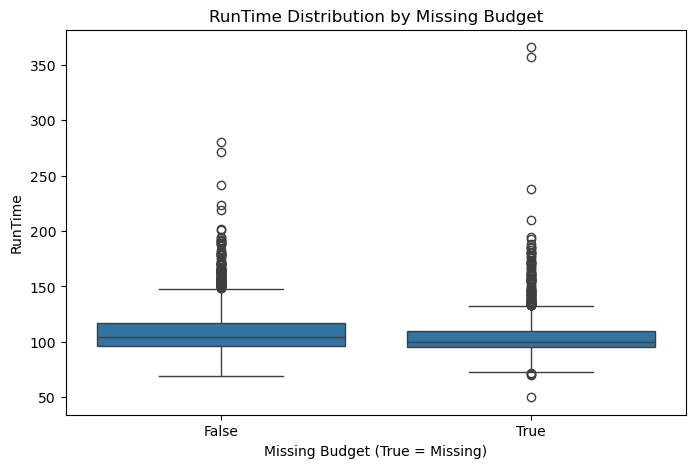

In [ ]:
# Visualize the distribution of 'RunTime' for rows with and without missing 'Budget'
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression

plot_df = pd.DataFrame({
    'MissingBudget': missing_mask,
    'RunTime': df['RunTime']
})

plt.figure(figsize=(8, 5))
sns.boxplot(data=plot_df, x='MissingBudget', y='RunTime')
plt.xlabel('Missing Budget (True = Missing)')
plt.ylabel('RunTime')
plt.title('RunTime Distribution by Missing Budget')
plt.show()


## Using Correlations to Search for Patterns

In [ ]:
# Create missingness indicators
missing_cols = ['Budget','Gross']
missing_indicators = df[missing_cols].isna().astype(int)
missing_indicators.columns = [f'{col}_missing' for col in missing_cols]

# Concatenate indicators with numeric columns
numeric_cols = df.select_dtypes(include='number')
numeric_with_missing = pd.concat([numeric_cols, missing_indicators], axis=1)

# Compute correlation between missing indicators and numeric variables
correlation_results = numeric_with_missing.corr().loc[
    numeric_with_missing.columns.str.contains('_missing'),
    ~numeric_with_missing.columns.str.contains('_missing')
]

correlation_results

,Year,Budget,Gross,RunTime,Score,Votes,Age,Target,Release_Month,Movie_Title_Length,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
Budget_missing,-0.23,NaN,-0.31,-0.08,0.02,-0.27,0.23,NaN,-0.05,-0.01,0.00,-0.19,-0.22,0.04,-0.14,0.14,-0.15,-0.00,-0.03,0.01,-0.06,-0.06,-0.00,0.11,0.13,0.20,0.03,-0.02,-0.04
Gross_missing,-0.02,-0.01,NaN,0.01,0.01,-0.00,0.02,NaN,0.01,-0.01,-0.01,-0.00,-0.01,0.01,-0.01,-0.01,-0.01,0.04,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.01,0.02,-0.01


## Pearson Correlation

**The table above shows Pearson correlation coefficients between the missingness indicators and numeric variables.**

Correlation value:
    
    Close to 0 : No linear relationship
    
    >|0.1| : Weak relationship

    >|0.2| : Moderate relationship
    
    >|0.3| : Strong relationship

    Value > 0 : When the numeric variable is high, missingness is more likely.

    Value < 0 : When the numeric variable is high, missingness is less likely.
    
### **Interpretation**

Budget_missing:
    
    vs. Votes (-0.27) : Missing budgets tend to occur in movies with fewer votes (less popular/small films)
    vs. Gross (-0.31) : Missing budgets tend to belong to movies with very low gross revenues
    vs. Year/Age (+0.23) : Older movies tend to have missing budgets
    vs. Top_Country_3 (+0.20) : Certain countries have more missing budgets (likely non-US films)

Budget_missing correlations are moderate for the above variables (besides Gross which shows a strong relationship). There are smaller correlations around |0.14| with rating/genre indicators. **Our analysis confirms Budget missing has a MNAR pattern.**

Gross_missing:

Correlations are all near 0. **Missing Gross is missing completely random (MCAR).** This makes sense because there is only one missing value.

## Heatmap of Missing Data

Heatmap below shows exact overlap between Budget and Target, and also with Gross and Target. This makes sense because our Target (profitability) requires both Budget and Gross in order to be calculated.

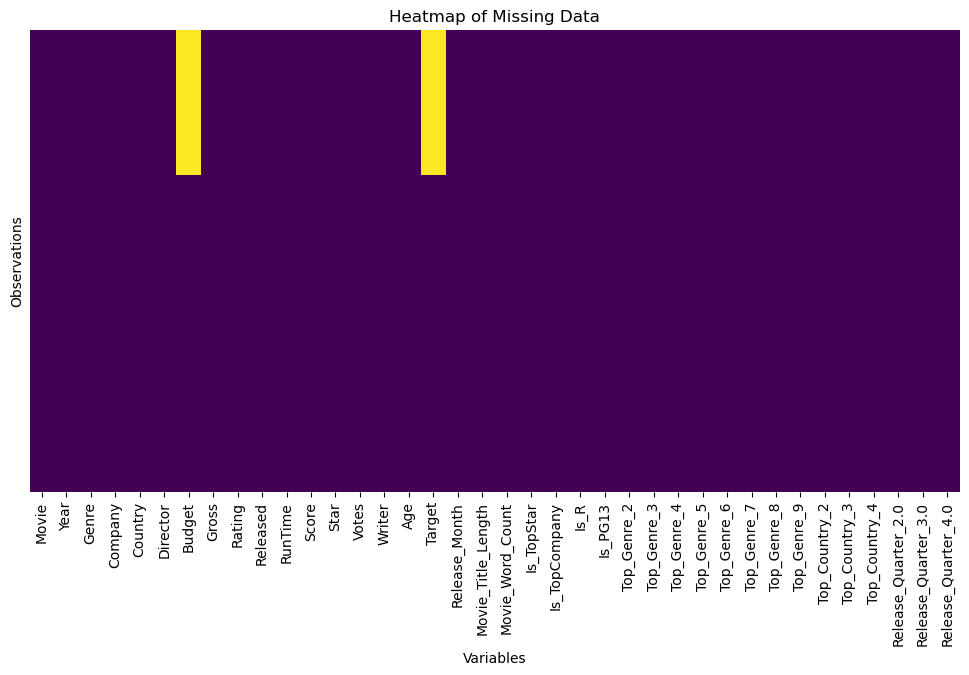

In [ ]:
# Sort by Budget and Movie_Word_Count for better visualization
sorted_df = df.sort_values(by=['Budget', 'Gross'], na_position='first')

plt.figure(figsize=(12, 6))
sns.heatmap(sorted_df.isnull(), cbar=False, cmap='viridis', yticklabels=False)
plt.title('Heatmap of Missing Data')
plt.xlabel('Variables')
plt.ylabel('Observations')
plt.show()

## Handling Missing Data
Based on the analysis above, we will do the following w.r.t. our missing data:

**Budget**  
- **Missing Proportion:** 32.3%  
- **Importance:** High, Critical predictor  
- **Missingness Pattern:** MNAR (missing strongly correlated with Company, Votes, and Age. Small independent studios are disproportionately missing budgets. Missingness affects Target because profitability cannot be computed without Budget.
- **Remedy:** Due to the importance of predictor and high amount of missing data, we will perform regression imputation. IMPORTANT: before imputing we will drop all rows where Budget == 0 because 0 is not a real value (treated as missing).

**Gross**  
- **Missing Proportion:** 0.015% (only 1 value)  
- **Importance:** High, Critical for Target
- **Missingness Pattern:** MCAR (one isolated missing case)  
- **Remedy:** We will drop the single row with missing value.

## Gross : Drop 1 missing row

Check the missing values before and after dropping the row to confirm effect.

In [ ]:
# Check how many missing values in Gross
print("Missing Gross values before dropping:", df['Gross'].isna().sum())

# Drop rows where Gross is missing
df = df.dropna(subset=['Gross'])

# Verify that missing values are gone
print("Missing Gross values after dropping:", df['Gross'].isna().sum())

Missing Gross values before dropping: 1
Missing Gross values after dropping: 0


In [ ]:
# Check how many missing values in Gross
print("Missing Gross values before dropping:", df['Gross'].isna().sum())

# Drop rows where Gross is missing
df = df.dropna(subset=['Gross'])

# Verify that missing values are gone
print("Missing Gross values after dropping:", df['Gross'].isna().sum())

Missing Gross values before dropping: 0
Missing Gross values after dropping: 0


## Budget : Regression Imputation

After regression imputation, some predicted values for Budget were negative. Budget is right-skewed with a large range (0-$450M); missing budgets tend to be from small indie films, leading the model to predict small values, and sometimes negative. We fixed this by replacing all negative or zero values with a minimum of 1. This is because Budget naturally cannot be negative, and would not give us meaningful results. R-squared value of 0.6 is reasonable for our Budget imputation, so we update our main df with these values. We then check the missing and minumum values of Budget after the imputation to confirm effect.

In [ ]:
# Drop all rows where Budget == 0. We treat these as missing values.
df = df[df['Budget'] != 0]

# Display correlation matrix with Budget
correlations = df.select_dtypes(include=["number"]).corr()["Budget"].sort_values(ascending=False)

print(correlations)

Budget                 1.00
Gross                  0.68
Votes                  0.45
Is_TopCompany          0.32
Top_Genre_3            0.32
RunTime                0.31
Year                   0.26
Top_Genre_7            0.24
Is_TopStar             0.23
Is_PG13                0.23
Movie_Title_Length     0.11
Release_Quarter_2.0    0.09
Top_Genre_5            0.09
Movie_Word_Count       0.09
Score                  0.07
Release_Month          0.07
Release_Quarter_4.0    0.04
Target                -0.01
Top_Country_2         -0.02
Top_Country_3         -0.03
Release_Quarter_3.0   -0.04
Top_Genre_9           -0.05
Top_Genre_6           -0.06
Top_Country_4         -0.07
Top_Genre_4           -0.09
Top_Genre_8           -0.12
Top_Genre_2           -0.14
Age                   -0.26
Is_R                  -0.30
Name: Budget, dtype: float64


In [ ]:
# Only looking at highly correlated variables:

# Filter correlations with absolute value >= 0.1
high_corr_variables = correlations[correlations.abs() >= 0.1]

# Display the filtered variables
print(high_corr_variables)

Budget                1.00
Gross                 0.68
Votes                 0.45
Is_TopCompany         0.32
Top_Genre_3           0.32
RunTime               0.31
Year                  0.26
Top_Genre_7           0.24
Is_TopStar            0.23
Is_PG13               0.23
Movie_Title_Length    0.11
Top_Genre_8          -0.12
Top_Genre_2          -0.14
Age                  -0.26
Is_R                 -0.30
Name: Budget, dtype: float64


In [ ]:
# Confirm that Budget Zeros were dropped

df['Budget'].describe()

count         4,627.00
mean     36,216,457.80
std      39,989,306.45
min           6,000.00
25%      10,000,000.00
50%      23,000,000.00
75%      46,000,000.00
max     300,000,000.00
Name: Budget, dtype: float64

In [ ]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Extract the features and target
features = list(high_corr_variables.index)
target = 'Budget'

# Remove the target variable from the features list
features.remove(target)

# Splitting the dataset into training and testing subsets
train_df = df[df[target].notnull()]
test_df = df[df[target].isnull()]

# Drop rows with missing values in predictors
train_df_clean = train_df.dropna(subset=features)

# Extract the cleaned features and target
train_features = train_df_clean[features]
train_target = train_df_clean[target]

# Initialize and train the regression model
model = LinearRegression()
model.fit(train_features, train_target)

# Predict the missing values
test_features = test_df[features].dropna()  # Drop rows with missing predictors
predicted_values = model.predict(test_features)  # Regression predicts, but may be negative

predicted_values = np.maximum(predicted_values, 1) #Sets lower limit to 1 (Could set to 0 but we already dropped 0s)

# Calculate the R-squared score for the model
r2_score = model.score(train_features, train_target)

# Output the R-squared score
print(f"R-squared score: {r2_score}")


R-squared score: 0.6148589668245286


R-squared value of 0.6 is reasonable for our Budget imputation.

In [ ]:
# Assigning the predicted values back to the main dataframe
df.loc[test_features.index, 'Budget'] = predicted_values

# Verifying the imputation

missing_after_imputation = df['Budget'].isnull().sum()
zeros_after_imputation = (df['Budget'] == 0).sum()

print(f"Number of missing values in 'Budget' after imputation: {missing_after_imputation}")
print(f"Number of zeros in 'Budget' after imputation: {zeros_after_imputation}")


Number of missing values in 'Budget' after imputation: 0
Number of zeros in 'Budget' after imputation: 0


In [ ]:
#Confirm minimum value is not negative nor 0
df['Budget'].describe()

count         6,755.00
mean     29,250,694.00
std      35,493,563.77
min               1.00
25%       7,690,838.38
50%      18,000,000.00
75%      35,000,000.00
max     300,000,000.00
Name: Budget, dtype: float64

## Dropping Irrelevant and Repetitive Features

We will now drop irrelevant features. We decide to drop Director and Writer entirely, as we feel Star is the more relevant predictor. We drop repetitive features (e.g. drop Year because we are keeping Age; drop Released because we have Release_Quarters; drop Star because we have Is_TopStar, etc.

## Creating cleaned_numeric_df and cleaned_cat_df
Then, we use our cleaned df to create our subsets cleaned_numeric_df and cleaned_cat_df. We choose all the numeric columns to go into cleaned_numeric_df. Then we select everything else including simple binary indicators (Target, Is_TopStar, Is_TopCompany, Is_R, Is_PG13) and one hot-encoded variables (Top_Genre_2 through 9, Top_Country 2 through 4, Release_Quarter_2.0 through 4,0) to go into cleaned_cat_df.

In [ ]:
df.columns

Index(['Movie', 'Year', 'Genre', 'Company', 'Country', 'Director', 'Budget',
       'Gross', 'Rating', 'Released', 'RunTime', 'Score', 'Star', 'Votes',
       'Writer', 'Age', 'Target', 'Release_Month', 'Movie_Title_Length',
       'Movie_Word_Count', 'Is_TopStar', 'Is_TopCompany', 'Is_R', 'Is_PG13',
       'Top_Genre_2', 'Top_Genre_3', 'Top_Genre_4', 'Top_Genre_5',
       'Top_Genre_6', 'Top_Genre_7', 'Top_Genre_8', 'Top_Genre_9',
       'Top_Country_2', 'Top_Country_3', 'Top_Country_4',
       'Release_Quarter_2.0', 'Release_Quarter_3.0', 'Release_Quarter_4.0'],
      dtype='object')

In [ ]:
df.drop(['Movie','Year', 'Genre', 'Company', 'Country', 'Director', 'Rating', 'Released', 'Star', 'Writer', 'Release_Month', 'Movie_Title_Length'], axis=1, inplace=True)

df

,Budget,Gross,RunTime,Score,Votes,Age,Target,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,,,,,
1,"8,000,000.00","52,287,414.00",89,8.10,299174,39,1,3,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,"6,000,000.00","70,136,369.00",103,7.80,264740,39,1,4,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,"15,000,000.00","179,800,601.00",110,6.90,236909,39,1,2,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,"18,500,000.00","85,160,248.00",137,8.40,540152,39,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,"9,000,000.00","18,564,613.00",90,6.90,36636,39,1,4,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6816,"14,924,804.53","4,750,497.00",91,5.40,9161,9,<NA>,4,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
6817,"17,992,801.50","28,368.00",90,4.90,1959,9,<NA>,3,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0
6818,"3,500,000.00","3,775,000.00",76,6.50,36333,9,1,4,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0


In [ ]:
cleaned_num_df = df[['Budget', 'Gross', 'RunTime', 'Score', 'Votes', 'Age', 'Movie_Word_Count']]
cleaned_num_df

,Budget,Gross,RunTime,Score,Votes,Age,Movie_Word_Count
ID,,,,,,,
1,"8,000,000.00","52,287,414.00",89,8.10,299174,39,3
2,"6,000,000.00","70,136,369.00",103,7.80,264740,39,4
3,"15,000,000.00","179,800,601.00",110,6.90,236909,39,2
4,"18,500,000.00","85,160,248.00",137,8.40,540152,39,1
5,"9,000,000.00","18,564,613.00",90,6.90,36636,39,4
...,...,...,...,...,...,...,...
6816,"14,924,804.53","4,750,497.00",91,5.40,9161,9,4
6817,"17,992,801.50","28,368.00",90,4.90,1959,9,3
6818,"3,500,000.00","3,775,000.00",76,6.50,36333,9,4


In [ ]:
numeric_cols = ['Budget', 'Gross', 'RunTime', 'Score', 'Votes', 'Age', 'Movie_Word_Count']

cleaned_cat_df = df.drop(columns=numeric_cols)

cleaned_cat_df.head()

,Target,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,
1,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


## Multicollinearity

Muticollinearity occurs when two or more predictor variables in a multiple regression model are highly correlated (one can predict the other quite accurately). Multicollinearity is problematic leading to unstable coefficients, reduced precision, and misleading significance. We will use correlation matrix and variance inflation factor (VIF) to detect any multicollinearity among explanatory independent variables in our dataset. We already removed duplicates (avoiding the dummy variable trap) from our dummies, and dropped original columns which those dummies were derived. We will drop our target

### VIF: We will address VIFs >10.0 that indicate significant multicollinearity

**Low VIF (<5)**: Indicates low multicollinearity

**Moderate VIF (5-10)**: May suggest some multicollinearity but not critical

**High VIF (>10)**: Indicates significant multicollinearity, which can impact the reliability of regression coefficients.

**We see that we have two problematic variables with very high VIF and significant multicollinearity: RunTime (VIF 36.86) and Score (VIF 40.07). We will explore this further by checking the correlation matrix.**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Calculate VIF for each explanatory variable
vif_data = pd.DataFrame()
vif_data["variable"] = cleaned_num_df.columns
vif_data["VIF"] = [variance_inflation_factor(cleaned_num_df.values, i) for i in range(cleaned_num_df.shape[1])]

vif_data.sort_values("VIF", ascending=False, inplace=True)

vif_data

,variable,VIF
2,RunTime,39.96
3,Score,36.85
5,Age,8.04
6,Movie_Word_Count,4.07
0,Budget,3.82
1,Gross,3.66
4,Votes,2.58


## Correlation Matrix Analysis

Correlation Matrix Guideline: Close to 1 or -1 shows strong positive/negative linear correlation. Close to 0 meaks weak or no correlation. General Guideline: High correlation (>0.8); Moderate correlation (0.5-0.7).

**Observations from Correlations**:

**Gross & Budget (0.7) - moderate to high correlation**.
    
Strong positive correlation. This makes sense because higher budget movies often make more money. This is still below the 0.8 threshold and both values are necessary to calculate our target: profitability.

**Votes & Gross (0.66) and Votes & Budget (0.49) - moderate correlation**.

Votes are moderately correlated with Gross and Budget. This makes sense because the more popular movies with more votes thend to have bigger budgets or higher grosses. These are still below the 0.8 threshold. We will keep them due to their necessity in our target calculation and due to the importance of these features.

**RunTime & Score (0.40) -- low to moderate correlation**.
Longer movies tend to get slightly higher scores. This explains why RunTime and Score had very high VIFs.

## Action based on VIF and Correlation Matrix Analysis

The high VIFs for **RunTime (40)** and **Score (37)** are largely due to their correlation with each other (0.40) as well as indirect correlations with Votes, Budget, and Gross. Between the two, RunTime is conceptually more relevant to our analysis, whereas Score primarily reflects audience popularity and how the film was perceived. While a higher score might generally correspond to higher profitability, it doesn’t provide actionable insight into operational factors. On the other hand, RunTime directly relates to movie characteristics that could influence profitability. **Therefore, we choose to drop the Score feature to reduce multicollinearity.** We drop it in both our cleaned num df as well as our main df for consistency. The remaining numeric features all have VIFs below 10 and do not require further modification.

**After dropping 'Score', VIFs are recalculated: remaining numeric variables drop to VIF<=2.74. This is great - our variables now indicate low multicollinearity.**

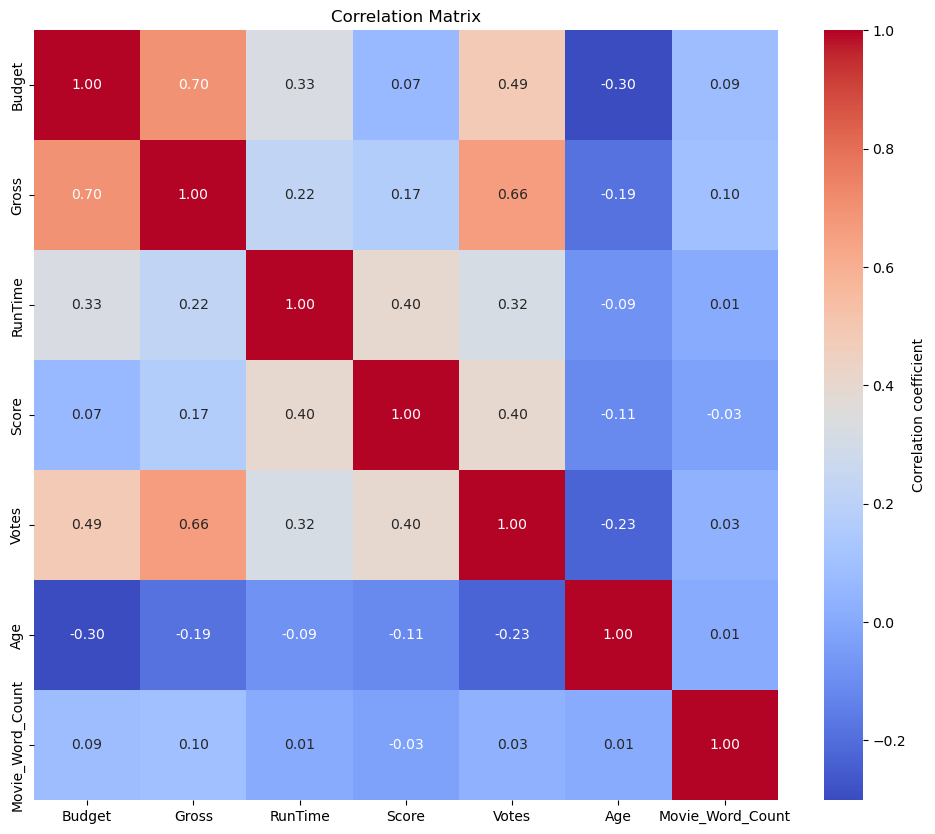

In [ ]:
# Calculate the correlation matrix of our numeric columns
correlation_matrix = cleaned_num_df.corr()

# Plot the correlation matrix using a heatma
plt.figure(figsize=(12, 10))  # Set the size of the figure
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            cbar_kws={'label': 'Correlation coefficient'})
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# Drop 'Score' from the numeric dataframe
cleaned_num_df = cleaned_num_df.drop(columns=['Score'], errors='ignore')

# Drop Score from the main df
df = df.drop(columns=['Score'], errors='ignore')

# Recalculate VIF after dropping Score

X = add_constant(cleaned_num_df)
vif_data = pd.DataFrame()
vif_data['variable'] = cleaned_num_df.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i+1) for i in range(len(cleaned_num_df.columns))]

vif_data.sort_values('VIF', ascending=False, inplace=True)
vif_data


,variable,VIF
1,Gross,2.74
0,Budget,2.21
3,Votes,1.92
2,RunTime,1.18
4,Age,1.12
5,Movie_Word_Count,1.01


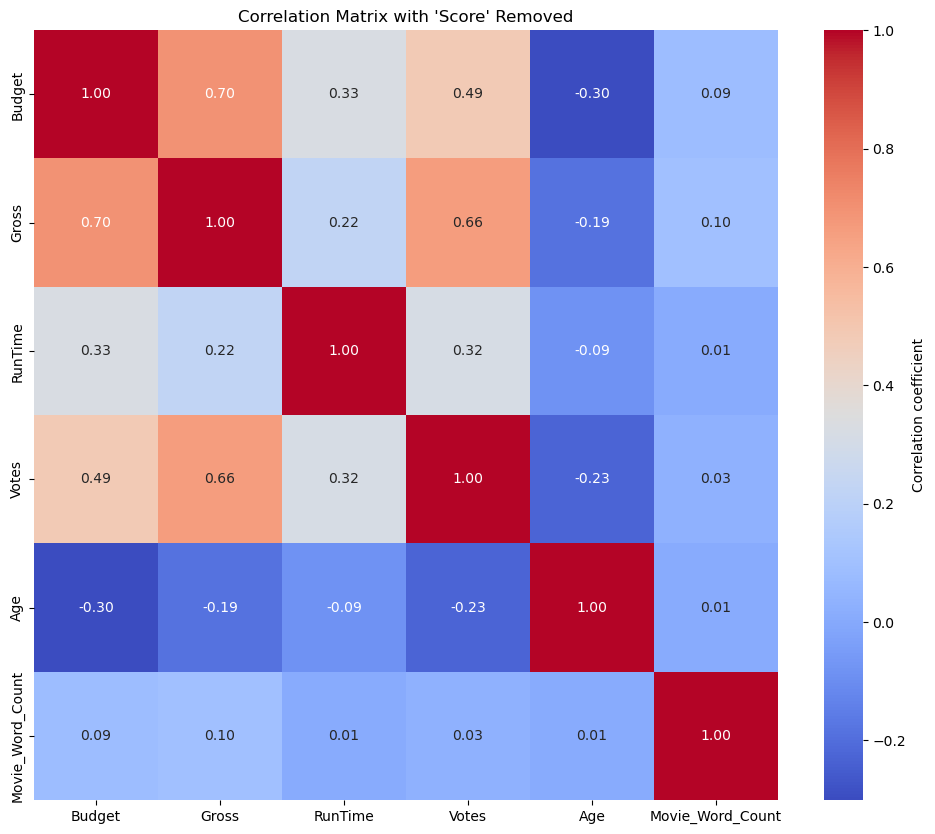

In [ ]:
# Updated correlation matrix without 'Score'
correlation_matrix = cleaned_num_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            cbar_kws={'label': 'Correlation coefficient'})
plt.title("Correlation Matrix with 'Score' Removed")
plt.show()

## Outliers

Outliers are data points that are significantly different from the majority of the data. They can occur due to variability in measurement, experimental errors, or genuinely different data points. Outliers can have an impact on machine learning models (skewed results, poor model performance, overfitting risk).

We will identify outliers using statistical methods (Z-Score and Interquartile Range Method). Then we will visualize using box plots and scatter plots.

**Guidelines:**

**Z-Score** measures the number of standard deviations away from the mean. Common threshold is -3 to 3.

**IQR**:

Minor Outliers: Within 1.5-3 times IQR -- Do not remove

Major Outliers: Beyond 3 times IQR -- Likely need to remove, depending on various factors discussed later.

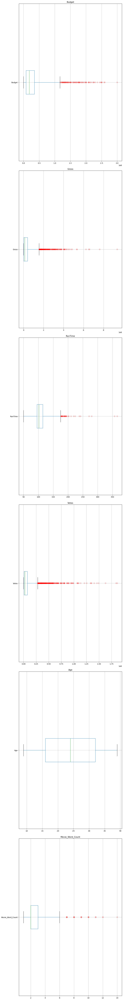

In [ ]:
# Define the columns you want to plot, which are numerical and meaningful for outliers detection
numerical_columns = cleaned_num_df.columns

# Create box plots for each variable with whiskers extending to 3 x IQR
fig, axes = plt.subplots(len(numerical_columns), 1, figsize=(10, 80))

for i, col in enumerate(numerical_columns):
    df.boxplot(column=col, ax=axes[i], whis=3, vert=False, flierprops=dict(marker='o', markeredgecolor='red', alpha=0.5))
    axes[i].set_title(col)

plt.tight_layout()
plt.show()

In [ ]:
cleaned_num_df.columns

Index(['Budget', 'Gross', 'RunTime', 'Votes', 'Age', 'Movie_Word_Count'], dtype='object')

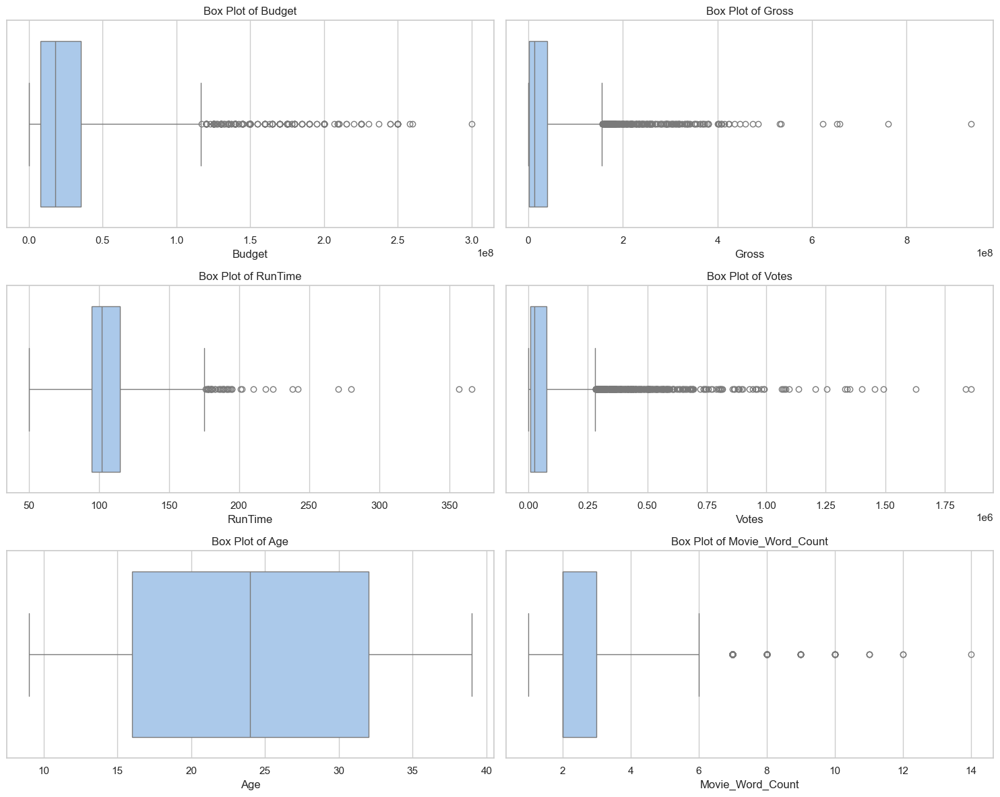

In [ ]:
# Set the aesthetic style of the plots (optional)
sns.set_style("whitegrid")  # Other options include: darkgrid, white, dark, ticks
sns.set_context("notebook")  # Other options include: paper, notebook, talk, poster
sns.set_palette("pastel")  # Other options include: deep, muted, bright, dark, colorblind



# Create a figure and a set of subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 12))

# Box plot for 'Budget'
sns.boxplot(x=df['Budget'], ax=axes[0,0], whis=3)
axes[0,0].set_title('Box Plot of Budget')

# Box plot for 'MntMeatProducts'
sns.boxplot(x=df['Gross'], ax=axes[0,1], whis=3)
axes[0,1].set_title('Box Plot of Gross')

# Box plot for 'MntFishProducts'
sns.boxplot(x=df['RunTime'], ax=axes[1,0], whis=3)
axes[1,0].set_title('Box Plot of RunTime')

# Box plot for 'MntSweetProducts'
sns.boxplot(x=df['Votes'], ax=axes[1,1], whis=3)
axes[1,1].set_title('Box Plot of Votes')

# Box plot for 'MntSweetProducts'
sns.boxplot(x=df['Age'], ax=axes[2,0], whis=3)
axes[2,0].set_title('Box Plot of Age')

# Box plot for 'MntSweetProducts'
sns.boxplot(x=df['Movie_Word_Count'], ax=axes[2,1], whis=3)
axes[2,1].set_title('Box Plot of Movie_Word_Count')

# Display the plots
plt.tight_layout()
plt.show()

## Plotting/Counting Outliers & Further Action

We see from our box plots and from our outlier counts that Age has no outliers, but the remaining 5 variables do have high outliers > 3IQR.

We have three options and general guidelines:
1. **Ignoring the outliers** - when outliers are <1% for that feature, outliers seem to be natural scores for that feature, and the scores are not too extreme.
2. **Listwise deletion** - when outliers are <5% for that feature, and outliers do not seem to be natural scores/are erroneous.
3. **Winsorizing** - when the criteria above does not apply.


Below is our outliers count for reference.

    Outliers count and percentage per feature:
    
    Budget: 259 (3.83%)
    Gross: 272 (4.03%)
    RunTime: 46 (0.68%)
    Votes: 375 (5.55%)
    Age: 0 (0.00%)
    Movie_Word_Count: 164 (2.43%)

Action:
1. **Age (No Action)** - No outliers; there is no action to take.
2. **RunTime (Ignore)** - < 1% of outliers and they seem to be a natural variation in movie lengths, so we will ignore these.
3. **Movie_Word_Count (Ignore)** - Although outliers >1%, the outliers for word count range from 7-14 words. This seems like a natural variation, so we will ignore these too.
4. **Budget, Gross, Votes (Winsorizing)** - All contain between 3.83-5.55% outliers. Looking at the box plots, we can see that these variables have many high outliers WAY beyond 3IQR. Outliers are extreme and should be handled; we will winsorize these values. This means we will replace the outliers' score (all outliers >3IQR) with the upper/lower bound score (in this case, all outliers are high so they will replace the upper bound score: +3IQR). We apply winsorization to the main df so all changes are permanent and downstream analyses reflect the capped values. Note: During winsorization, we decided to cap only the high-end outliers for Budget, while winsorizing both ends for other numeric features like Gross and Votes. The reason is that budget naturally cannot be negative, so the lower bound (negative) is not meaningful. Only high values could distort the model, so we only adjust the right tail.

**Winsorizing our outliers - Confirmation**

After winsorizing our outliers, we rerun the count of outliers to see its effects. We can see that Budget, Gross, Votes, and Age outlier counts all dropped to 0, so our winsorization method took effect. RunTime and Movie_Word_Count outliers still remain because we decided to ignore them (leave them in).

In [ ]:
df['Budget'].describe()

count         6,755.00
mean     29,250,694.00
std      35,493,563.77
min               1.00
25%       7,690,838.38
50%      18,000,000.00
75%      35,000,000.00
max     300,000,000.00
Name: Budget, dtype: float64

In [ ]:
# Dictionary to hold the count of outliers for each column
outliers_count = {}
outliers_percent = {}

# Loop through each numerical column to calculate outliers
for column in cleaned_num_df.columns:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define bounds
    lower_bound = Q1 - 3 * IQR
    upper_bound = Q3 + 3 * IQR

    # Count outliers USING df
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    outliers_count[column] = len(outliers)

    # Convert to percent
    outliers_percent[column] = (len(outliers) / len(df)) * 100

# Print the results
print("Outliers count and percentage per feature:")
for key in cleaned_num_df.columns:
    print(f"{key}: {outliers_count[key]} ({outliers_percent[key]:.2f}%)")


Outliers count and percentage per feature:
Budget: 259 (3.83%)
Gross: 272 (4.03%)
RunTime: 46 (0.68%)
Votes: 375 (5.55%)
Age: 0 (0.00%)
Movie_Word_Count: 164 (2.43%)


In [ ]:
cleaned_num_df.shape

(6755, 6)

In [ ]:
from scipy.stats.mstats import winsorize

winsorize_cols = ['Budget', 'Gross', 'Votes']

for column in winsorize_cols:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    upper_bound = Q3 + 3 * IQR
    lower_bound = Q1 - 3 * IQR

    if column == 'Budget':
        # ONLY upper winsorization (Budget should never be forced upward)
        upper_limit = (df[column] > upper_bound).sum() / len(df[column])

        wins = winsorize(df[column], limits=(0, upper_limit))
        df[column] = wins.data

    else:
        # Winsorize both ends normally
        lower_limit = (df[column] < lower_bound).sum() / len(df[column])
        upper_limit = (df[column] > upper_bound).sum() / len(df[column])

        wins = winsorize(df[column], limits=(lower_limit, upper_limit))
        df[column] = wins.data

df[winsorize_cols].describe()

,Budget,Gross,Votes
count,"6,755.00","6,755.00","6,755.00"
mean,"27,530,975.29","29,984,356.98","59,914.99"
std,"28,830,668.45","40,950,154.74","77,530.28"
min,1.00,70.00,27.00
25%,"7,690,838.38","1,612,955.00","7,891.50"
50%,"18,000,000.00","12,440,858.00","26,520.00"
75%,"35,000,000.00","40,226,607.50","76,532.00"
max,"116,722,457.82","155,464,351.00","280,858.00"


In [ ]:
# Rerun earlier code to check the outlier counts again after winsorization

# Dictionary to hold the count of outliers for each column
outliers_count = {}

# Loop through each numerical column to calculate outliers
for column in numerical_columns:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define bounds for outliers
    lower_bound = Q1 - 3 * IQR
    upper_bound = Q3 + 3 * IQR

    # Count outliers
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    outliers_count[column] = len(outliers)

# Print the results
print("Outliers count per feature:")
for key, value in outliers_count.items():
    print(f"{key}: {value}")

Outliers count per feature:
Budget: 0
Gross: 0
RunTime: 46
Votes: 0
Age: 0
Movie_Word_Count: 164


In [ ]:
# Let cleaned_num_df reflect the same winsorized values performed in df.

cleaned_num_df = df[['Budget', 'Gross', 'RunTime', 'Votes', 'Age', 'Movie_Word_Count']]

## Apply Feature Scaling

Feature scaling is a preprocessing technique used in machine learning to standardize the range of continuous variables. Its purpose is to ensure that all numeric features contribute proportionally during model training. In our dataset, the numeric predictors span vastly different scales—for example, Movie_Word_Count ranges from single digits, while Budget and Gross range into the tens or hundreds of millions. Votes also spans from 27 to 1.86 million. Without scaling, a change of $1 in Budget is negligible relative to its full range, whereas a 1-word change in Movie_Word_Count is comparatively large. Models that rely on distance, gradients, or magnitude-based optimization can therefore become biased toward the features with the largest numeric ranges.

To address this, we applied standardization (using StandardScaler), which transforms each continuous feature to have a mean of 0 and a standard deviation of 1. This improves model performance, prevents domination by large-valued features, and speeds up convergence during optimization.

**We applied scaling only to true continuous numeric variables** (Budget, Gross, RunTime, Votes, Age, and Movie_Word_Count). **Dummy variables and binary indicators were excluded**, as scaling them would distort their interpretation and does not provide modeling benefits.
After scaling, all continuous features are placed on a comparable scale, enhancing model stability and ensuring that no single variable disproportionately influences learning.

After scaling: We notice that there are missing values in Target. Missing target values are expected because the target depends on both Budget and Gross (which both contained missing values before imputation). If either variable is missing, the relationship cannot be computed, so the target remains NA. Machine learning models cannot train on missing target values, so before modeling, **We will drop the rows where Target is missing/NA**. Note that the target should never be imputed because that would introduce bias into our model.

This is a good time to drop these rows, as dropping earlier would shrink the dataset while computing outlier bounds, change means/IQRs/SDs used for scaling, and alter regression imputation quality - 2128 rows (32%) of Target was originally missing. Dropping now right before modeling ensures that all preprocessing uses the full dataset, no information is leaked from the target into preprocessing, and that our model will train only on rows with valid labels.


In [ ]:
# df before scaling non-dummy numeric features
df.head()

,Budget,Gross,RunTime,Votes,Age,Target,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,,,,
1,"8,000,000.00","52,287,414.00",89,280858,39,1,3,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,"6,000,000.00","70,136,369.00",103,264740,39,1,4,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,"15,000,000.00","155,464,351.00",110,236909,39,1,2,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,"18,500,000.00","85,160,248.00",137,280858,39,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,"9,000,000.00","18,564,613.00",90,36636,39,1,4,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [ ]:
# export as a file for comparison later
df.to_excel("df_before_scaling.xlsx")

In [ ]:
from sklearn.preprocessing import StandardScaler

# Columns to scale (cleaned_num_df already contains only real numeric features)
numeric_to_scale = cleaned_num_df.columns

# Apply scaling to non-dummy numeric features
scaler = StandardScaler()
df[numeric_to_scale] = scaler.fit_transform(df[numeric_to_scale])

# Display df after scaling
df.head()

,Budget,Gross,RunTime,Votes,Age,Target,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,,,,
1,-0.68,0.54,-0.97,2.85,1.69,1,0.19,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,-0.75,0.98,-0.20,2.64,1.69,1,0.85,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,-0.43,3.06,0.19,2.28,1.69,1,-0.47,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,-0.31,1.35,1.68,2.85,1.69,1,-1.13,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,-0.64,-0.28,-0.92,-0.30,1.69,1,0.85,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [ ]:
df.shape

(6755, 25)

In [ ]:
df['Target'].value_counts(dropna=False)

Target
0       2350
1       2277
<NA>    2128
Name: count, dtype: Int64

In [ ]:
# We see Target has 2128 rows "NA". Drop these columns before modeling.
df.dropna(subset=['Target'], inplace=True)

# Check to make sure the 2128 rows were dropped
df.shape

(4627, 25)

## Data Leakage: Dropping columns 'Budget' and 'Gross'

At this point we realized that we have an issue of data leakage. Since 'Budget' and 'Gross' were both used to calculate our 'Target' (profitability), they need to be removed as features in our modeling. Without this step, our model would be trained on information that it would not have at the time of making real predictions; the model would "cheat" by seeing part of the answer during training. This would cause the model to do well in training (artificially high accuracy) but it would perform poorly against new, real-world data.

In [ ]:
df.drop(columns=['Gross', 'Budget'], inplace=True)
df

,RunTime,Votes,Age,Target,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,,
1,-0.97,2.85,1.69,1,0.19,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,-0.20,2.64,1.69,1,0.85,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0.19,2.28,1.69,1,-0.47,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,1.68,2.85,1.69,1,-1.13,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,-0.92,-0.30,1.69,1,0.85,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,-0.92,-0.54,-1.67,1,0.19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
6810,-1.03,-0.68,-1.67,0,-0.47,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6812,-0.81,-0.71,-1.67,1,3.49,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1


In [ ]:
# Exporting data:

df.to_excel("Movies_cleaned_FINAL.xlsx")

## Model Testing and Optimization

We calculated a correlation matrix to understand how the numerical and encoded variables in our dataset relate to each other. Then we visualized it using an interactive heatmap to clearly identify any strong positive or negative relationships.

The results show that most variables have very weak correlations, meaning they do not move closely together. A few mild patterns appear for example, Votes has a small positive relationship with RunTime and the Target variable, and mutually exclusive categories (like ratings or release quarters) show expected negative correlations. Overall, the heatmap confirms that the dataset has no strong linear relationships or multicollinearity issues, and most features behave independently, which is just what we want to see before our modeling.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

import plotly.express as px

# Compute correlation matrix
corr = df.corr()

# Interactive heatmap
fig = px.imshow(
    corr,
    text_auto='.2f',
    color_continuous_scale='RdBu_r',
    zmin=-1, zmax=1,
    aspect='auto',
    height=1000
)

fig.update_layout(
    title='Correlation Matrix',
    xaxis_title='',
    yaxis_title='',
)

fig.show()

## Step 1: Split features from Target
We separated our dataset into features and the target variable to prepare it for modeling. All predictor variables were stored in X, while the outcome we want to predict (profitability) was stored in y. This step is essential because machine learning models need inputs (X) and outputs (y) kept separate so they can learn the relationships between them. The resulting feature set includes all standardized numerical values and encoded categorical variables that will be used to train the model.

In [ ]:
# Splitting features and Target:
#X as features and y as target

X = df.drop(['Target'], axis=1)
y = df['Target']

X

,RunTime,Votes,Age,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,
1,-0.97,2.85,1.69,0.19,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,-0.20,2.64,1.69,0.85,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0.19,2.28,1.69,-0.47,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,1.68,2.85,1.69,-1.13,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,-0.92,-0.30,1.69,0.85,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,-0.92,-0.54,-1.67,0.19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
6810,-1.03,-0.68,-1.67,-0.47,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6812,-0.81,-0.71,-1.67,3.49,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1


In [ ]:
y

ID
1       1
2       1
3       1
4       1
5       1
       ..
6809    1
6810    0
6812    1
6815    1
6818    1
Name: Target, Length: 4627, dtype: Int64

## Step 2: Train/Test Split

We split our dataset into a training set and a test set to properly evaluate the performance of our logistic regression model. Because the dataset is relatively large (N ≥ 500), we used a standard 80/20 split, assigning 80% of the observations to the training set (X_train, y_train) and the remaining 20% to the test set (X_test, y_test).

The training set is used to fit the model,estimating the coefficients and determining how strongly each feature contributes to predicting the target outcome (movie profitability).

The test set, which the model does not see during training, is then used to evaluate how well the model generalizes to new, unseen data. During testing, we hide the true target values and allow the model to produce predictions based only on X_test. Afterward, we compare those predictions to the actual y_test values to assess model performance.
This separation ensures that our evaluation is unbiased and protects against overfitting (where a model performs well on the data it was trained on but poorly on new, real-life data).

In [ ]:
# Splitting the dataset into the Training set and Test set
# test_size = 0.2 means 20%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X_train

,RunTime,Votes,Age,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,
1812,1.46,-0.04,0.80,-0.47,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
4678,-0.75,0.77,-0.66,-0.47,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
5327,-0.37,0.57,-1.00,1.51,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3690,-0.70,-0.70,-0.10,-1.13,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1
6505,-0.64,-0.22,-1.56,-0.47,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6547,1.13,-0.59,-1.56,-0.47,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0
990,1.74,-0.65,1.24,0.19,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1
4844,-0.53,0.11,-0.77,0.19,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
X_test

,RunTime,Votes,Age,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,
5104,0.08,0.89,-0.89,-1.13,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0
2061,-0.81,-0.54,0.68,2.17,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3825,0.69,0.44,-0.21,-1.13,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1
5130,1.24,-0.36,-0.89,-1.13,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0
41,0.58,-0.48,1.69,0.19,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4415,0.58,2.85,-0.55,0.85,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
744,-1.14,-0.62,1.36,-0.47,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4096,-0.37,-0.37,-0.33,-1.13,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1


In [ ]:
# Just the target for our training data
y_train

ID
1812    0
4678    1
5327    1
3690    0
6505    0
       ..
6547    0
990     0
4844    1
5707    0
1785    1
Name: Target, Length: 3701, dtype: Int64

In [ ]:
# Our answer key. We don't let the model see this.
y_test

ID
5104    0
2061    1
3825    0
5130    0
41      0
       ..
4415    1
744     0
4096    0
2940    1
6404    0
Name: Target, Length: 926, dtype: Int64

## Step 3: Build and Train the Model
We created a Logistic Regression model to predict the target variable based on the features in our dataset. Logistic Regression is well-suited for binary classification problems, where the outcome is either 0 or 1. By default, the model classifies observations as 1 if the predicted probability is greater than 50%, otherwise as 0.

We trained the model by fitting it on the training features (X_train) and the corresponding training targets (y_train). During this process, the model learned the relationships and patterns between the features and the target variable, allowing it to make predictions on new, unseen data.

In [ ]:
# Creating a Logistic Regression model (by default the threshold is set to 50%):
logreg = LogisticRegression()

# Training the model:
# Use logreg rule to fit the model and predict the target.
logreg.fit(X_train, y_train)

LogisticRegression()

## Step 4: Make predictions for test data
Using the trained logistic regression model, we generated predictions for the test dataset. The model examined each row in X_test and predicted whether the target value should be 0 or 1, based on the patterns it learned during training. These predicted labels (y_pred) represent the model’s classification decisions on unseen data. Next, we will compare y_pred with the true values in y_test to evaluate how the model performed.

In [ ]:
# Predicting the Test set results:

y_pred = logreg.predict(X_test)

y_pred

array([0., 0., 0., 0., 0., 1., 0., 1., 0., 1., 0., 1., 1., 0., 0., 0., 1.,
       1., 0., 1., 1., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 1., 1., 0.,
       1., 1., 1., 1., 0., 1., 0., 1., 1., 1., 1., 0., 1., 1., 0., 0., 0.,
       0., 1., 1., 1., 0., 0., 0., 1., 1., 1., 1., 0., 0., 1., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1., 1.,
       0., 1., 0., 1., 0., 0., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0., 1.,
       0., 0., 0., 0., 1., 0., 0., 1., 1., 1., 0., 1., 0., 0., 0., 1., 0.,
       0., 1., 0., 0., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 1.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0.,
       0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 1., 1., 1.,
       1., 0., 1., 1., 0.

## Step 5: Build a Confusion Matrix
The confusion matrix compares the model’s predictions to the actual outcomes and shows how well the model classified the test data. Our results indicate 360 true negatives and 280 true positives, meaning these were correctly identified by the model. However, the model also made 110 false positives and 176 false negatives, which represent misclassified cases. Overall, the confusion matrix helps us see not only how many predictions were correct, but also the types of errors the model is making.

Note: this confusion matrix is for our baseline threshold of 50%.

In [ ]:
# Building the Confusion Matrix:

print(confusion_matrix(y_test, y_pred))

[[360 110]
 [176 280]]


In [ ]:
# Creating a more readable matrix:

cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(cm,
                     index=['Actual Negative', 'Actual Positive'],
                     columns=['Predicted Negative', 'Predicted Positive'])

print(cm_df)

                 Predicted Negative  Predicted Positive
Actual Negative                 360                 110
Actual Positive                 176                 280


## The Null Model

The null model’s strategy is to always predict the most frequent outcome, which in this dataset is “No” (not profitable). By doing so, it would be correct 50.79% of the time, without using any features or learning patterns. Conversely, 49.31% of movies are profitable (“Yes”), showing that the dataset is almost evenly split between profitable and non-profitable movies.

The goal of our regression model is to (at the bare minimum) beat this null model strategy in making predictions.

In [ ]:
# Calculate the percentage of the sample that is profitable
profitable_perc = df['Target'].mean() * 100

# Print the results, rounding to 2 decimal places
if profitable_perc >= 50:
    null = round(profitable_perc, 2)
else:
    null = round(100 - profitable_perc, 2)

print(f"Null Model: {null}%")

Null Model: 50.79%


## Calculate Predictive Model

We took the four numbers from the confusion matrix and stored them separately as TN, FP, FN, and TP. This makes it easier to work with these values later when calculating model performance.

In [ ]:
# Pulling data from the confusion matrix

TN, FP, FN, TP = cm[0][0], cm[0][1], cm[1][0], cm[1][1]

TN, FP, FN, TP

(np.int64(360), np.int64(110), np.int64(176), np.int64(280))

## Calculate Overall Accuracy of the Model
We calculated the model’s predictive power (accuracy) by dividing the number of correct predictions (TN + TP) by the total number of predictions. The accuracy came out to 69.11%, meaning the model correctly classified about 69% of the test cases (both positive and negative results). Compared to the Null Model's accuracy of 50.79%, our 50% threshold regression model is 19% more accurate!

In [ ]:
# Calculating predictive power (Accuracy):

pred_power = round(((TN + TP) / (TN + TP + FN + FP))*100, 2)

print(f"Predictive Power (Accuracy): {pred_power}%")

Predictive Power (Accuracy): 69.11%


## Precision

We calculated the model’s precision, which measures how many of the movies predicted as profitable were actually profitable. The precision came out to 71.79%, meaning that when the model predicts a movie will be profitable, it is correct about 72% of the time.

In [ ]:
precision = round(((TP) / (TP + FP))*100, 2)

print(f"Precision: {precision}%")

Precision: 71.79%


## Sensitivity
We calculated the model’s sensitivity (also known as recall), which measures how well the model can identify profitable movies. The sensitivity is 61.4%, meaning the model correctly finds about 61% out of all movies in our dataset that are actually profitable.

In [ ]:
# The ability to "find" the profitable movies

sensitivity = round(((TP) / (TP + FN))*100, 2)

print(f"Sensitivity: {sensitivity}%")

Sensitivity: 61.4%


## Specificity

We calculated the model’s specificity, which measures how well the model identifies movies that are not profitable. The specificity is 76.6%, meaning the model correctly recognizes about 77% of movies that are actually unprofitable.

In [ ]:
# The ability to "find" the movies that are NOT profitable

specificity = round(((TN) / (FP + TN))*100, 2)

print(f"Specificity: {specificity}%")

Specificity: 76.6%


## Calculate the exponentiated beta coefficients (Odds Ratios)

We calculated odds ratios to see how each feature affects the chance of a movie being profitable. Values greater than 1 mean the feature increases the odds of profitability, and values less than 1 decrease it.

The strongest positive driver was Votes (exp(b) = 2.86), showing that movies with higher audience engagement are much more likely to be profitable. Other helpful features, like Top Genre 8, Age, and Top Company, also raise the odds of profitability, meaning certain genres, older movies, and strong production companies tend to perform better.

On the other hand, several features with odds ratios below 1, such as runtime, ratings (R or PG-13), and some genres, are linked to a lower chance of profitability. This means movies in these categories are slightly less likely to be profitable compared to the baseline.

In [ ]:
# Use the syntax below to print coefficients sorted from largest to smallest:

# Get the coefficients from the model
coefficients = logreg.coef_[0]

# Calculate the exponentiated coefficients (odds ratios: exp(B))
odds_ratios = np.exp(coefficients)

# Combine features and odds ratios, then sort from largest to smallest
sorted_odds = sorted(zip(X.columns, odds_ratios), key=lambda x: x[1], reverse=True)

# Print the sorted odds ratios
for feature, odds in sorted_odds:
    print(f"{feature}: exp(b) = {odds:.4f}")

Votes: exp(b) = 2.8550
Top_Genre_8: exp(b) = 1.8556
Age: exp(b) = 1.4390
Is_TopCompany: exp(b) = 1.1768
Release_Quarter_3.0: exp(b) = 1.1486
Movie_Word_Count: exp(b) = 1.1154
Top_Genre_6: exp(b) = 1.1008
Release_Quarter_2.0: exp(b) = 0.9592
Release_Quarter_4.0: exp(b) = 0.8219
Is_TopStar: exp(b) = 0.8104
Top_Genre_2: exp(b) = 0.7828
RunTime: exp(b) = 0.7667
Top_Genre_9: exp(b) = 0.7506
Top_Genre_4: exp(b) = 0.6539
Is_PG13: exp(b) = 0.6356
Top_Genre_7: exp(b) = 0.6190
Is_R: exp(b) = 0.5839
Top_Genre_5: exp(b) = 0.5484
Top_Country_2: exp(b) = 0.5292
Top_Country_4: exp(b) = 0.5190
Top_Genre_3: exp(b) = 0.4436
Top_Country_3: exp(b) = 0.3894


In [ ]:
# Get odds ratios
odds_ratios = np.exp(logreg.coef_[0])

# Build DataFrame for better visual
odds_df = pd.DataFrame({
    'Feature': X.columns,
    'Odds_Ratio': odds_ratios,
})

# Calculate percent change in odds
odds_df['Percent_Change_in_Odds'] = (odds_df['Odds_Ratio'] - 1) * 100

# Calculate effect direction
odds_df['Effect'] = np.where(odds_df['Odds_Ratio'] > 1, 'Increase', 'Decrease')

# Sort by Odds_Ratio descending
odds_df = odds_df.sort_values(by='Odds_Ratio', ascending=False).reset_index(drop=True)

# Display table
odds_df


,Feature,Odds_Ratio,Percent_Change_in_Odds,Effect
0,Votes,2.86,185.50,Increase
1,Top_Genre_8,1.86,85.56,Increase
2,Age,1.44,43.90,Increase
3,Is_TopCompany,1.18,17.68,Increase
4,Release_Quarter_3.0,1.15,14.86,Increase
5,Movie_Word_Count,1.12,11.54,Increase
6,Top_Genre_6,1.10,10.08,Increase
7,Release_Quarter_2.0,0.96,-4.08,Decrease
8,Release_Quarter_4.0,0.82,-17.81,Decrease
9,Is_TopStar,0.81,-18.96,Decrease


**Analysis: Odds Ratio exp(B) for each feature**

The table above shows how each feature uniquely contributes to our target of profitability. We explore these % Odds Ratios below.

% change in odds = ( odds_ratio - 1 ) * 100

A negative value shows a negative relationship and a positive value indicates a positive relationship to our target (profitability).

**Votes**
1. One standard deviation increase in votes increases the odds of profitability by approximately 186%, indicating our strongest positive releationship.

**Top_Genre**
1.   Top_Genre_8 (Horror) - Horror films have 86% higher odds of being profitable compared to Comedy films, controlling for all other variables.
2.   Top_Genre_6 (Biography) - Biographies have 10% higher odds of profitability than comedies.
3.   Top_Genre_2 (Drama) - Dramas have 22% lower odds of profitabiility compared to comedies.
4.   Top_Genre_9 (Other) - Films in the catch-all "Other" category have 25% lower odds of profitability relative to comedies.
5.   Top_Genre_4 (Crime) - Crime films show 35% lower odds of profitability relative to comedies.
6.   Top_Genre_7 (Animation) - Animation films have 38% lower odds of profitability than comedies.
7.   Top_Genre_5 (Adventure) - Adventure films have 45% lower odds of profitability than comedies.
8.   Top_Genre_3 (Action) - Action films have 56% lower odds of profitability relative to comedies. This is the worst performing genre of our model.


**Age**
1.  A one standard deviation increase in the age of the movie increase the odds of profitability by about 44%.

**Is_TopCompany**
1.   Being produced by a "top 10 company" increases the odds of profitability by roughly 18% compared to when the film is not produced by a top 10 company.

**Release_Quarter**:
1.   If a movie is released in Q3 (Jul-Sep), the odds of being profitable increase by ~15% compared to a movie released in Q1 (Jan-Mar).
2.   If released in Q2 (Apr-Jun), the odds of being profitable decrease by 4% compared to a movie released in Q1 (Jan-Mar).
3.   If released in Q4 (Oct-Dec), the odds of being profitable decrease by 17.81% compared to a movie released in Q1 (Jan-Mar).

**Movie_Word_Count**
1.   One standard deviation increase in movie title word count increases the odds of profitability by approximately 12%.

**Is_TopStar**
1.   Having a top star (who has appeared in 20 or more films in this dataset) decreases the odds of profitability by about 19% compared to films without top stars.

**RunTime**
1.   A one standard deviation increase in runtime decreases the odds of profitability by approximately 23%.

**Rating** (Is_PG13 vs Is_R)
1.   A PG-13 rating decreases the odds of profitability by about 36% compared to baseline rating category (our baseline is all other ratings, e.g. General audiences).
2.   An R rating decreases the odds of profitability by roughly 42% compared to the baseline rating cagtegory (our baseline is all other ratings, e.g. General audiences).

**Top Country**(UK,France,Other)

1.   Movies produced in the UK are about 47% less likely to be profitable compared to the movies made in USA.
2.   Movies produced in France are about 61% less likely to be profitable compared to movies made in USA.
3. Movies made in any other country are about 48% less likely to be profitable compared to the movies produced in USA.




##Key Findings of Our Features and Odds Ratios

**Votes**

One standard deviation increase in votes increases the odds of profitability by 186%, making it the strongest predictor in our model. **Higher audience engagement (votes) is strongly associated with higher profitability.**

**Genre**

Because Comedy was the reference category in our one-hot encoding, each Top_Genre coefficient represents how the odds of profitability change for that genre compared to a Comedy film, holding all else constant. The standardized odds ratios show that Horror films have the highest relative profitability (86% higher odds than Comedy), followed by Biographies (+10%). All other genres exhibit lower odds than Comedy, with Action (–56%), Adventure (–45%), Crime (–35%), and Animation (–38%) showing substantially reduced odds. This suggests that, after controlling for all other variables, **Comedy remains one of the more commercially reliable genres, while traditionally high-budget or high-risk genres like Action and Adventure underperform in profitability odds, likely due to higher production costs relative to returns.**

**Age**

A one standard deviation increase in a film's age increases the odds of profitability by 44%. **Older films tend to make more money over time through long-tail revenue (streaming, licensing, established fanbase, etc.).**

**Is_TopCompany**

Movies produced by a top-10 studio have approximately +18% higher odds of being profitable compared to non-top companies, highlighting the advantage of strong distribution, marketing resources, and brand recognition.

**Release_Quarter**

Using Q1 (Jan-Mar) as the baseline, Q3 (Jul-Sep) shows a +15% increase in odds of profitability, being the most profitable release window. Q4 (Oct-Dec) shows -18%, being the least profitable release period. **This suggests that the summer season delivers the strongest profitability, while the holiday season which is often assumed to be high-performing, is actually the riskiest in the dataset.**

**Movie_Word_Count**

A one standard deviation increase in movie title word count increases the odds of profitability by 12%. This suggests that **films with slightly longer or more descriptive titles tend to perform better financially. Longer titles may signal stronger branding, capture audience attention more effectively, or reflect marketing decisions that align with more commercially successful films.**
While the effect is moderate, it indicates that title structure—not just content—has a measurable relationship with profitability.

**Is_TopStar**

Surprisingly, **featuring a top star (starred in >=20 movies in our dataset) reduces profitability odds by ~19%. This is likely due to higher production and talent costs that do not always lead to a profitable return.**


**RunTime**

Longer runtime decreases profitability by ~23%. **Longer films would have fewer daily showtimes, hence lower audience turnover and potentially narrower audience appeal. All of these factors would decrease the film's revenue potential.**


**Rating (Is_PG13 vs Is_R)**

PG-13 movies are about 36% less likely to be profitable, and R-rated movies are about 42% less likely to be profitable, compared to our baseline of "everything else" or broader General Audiences. **In short, the more people you can allow into the theater, the better your chances of making a profit. Broader audience access increases profitability.**


**Top Country**
Compared to U.S. produced films as a baseline, movies made in France have the poorest odds, being roughly -61% less likely to be profitable, while films from the UK and all other non-U.S. countries also face significantly lower odds, at about -47% and -48% less likely, respectively. **This clear hierarchy shows the dominant economic and market size advantages of the U.S. film industry, suggesting that production location is one of the most critical factors for financial success.**

Below are a key of our features for reference:

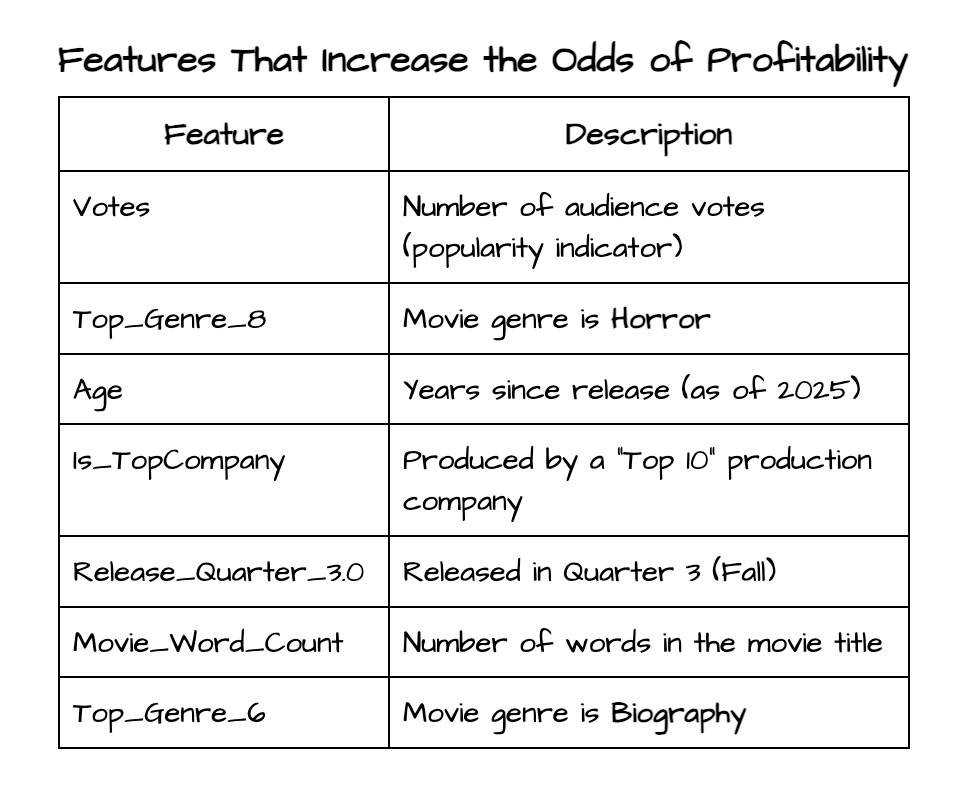

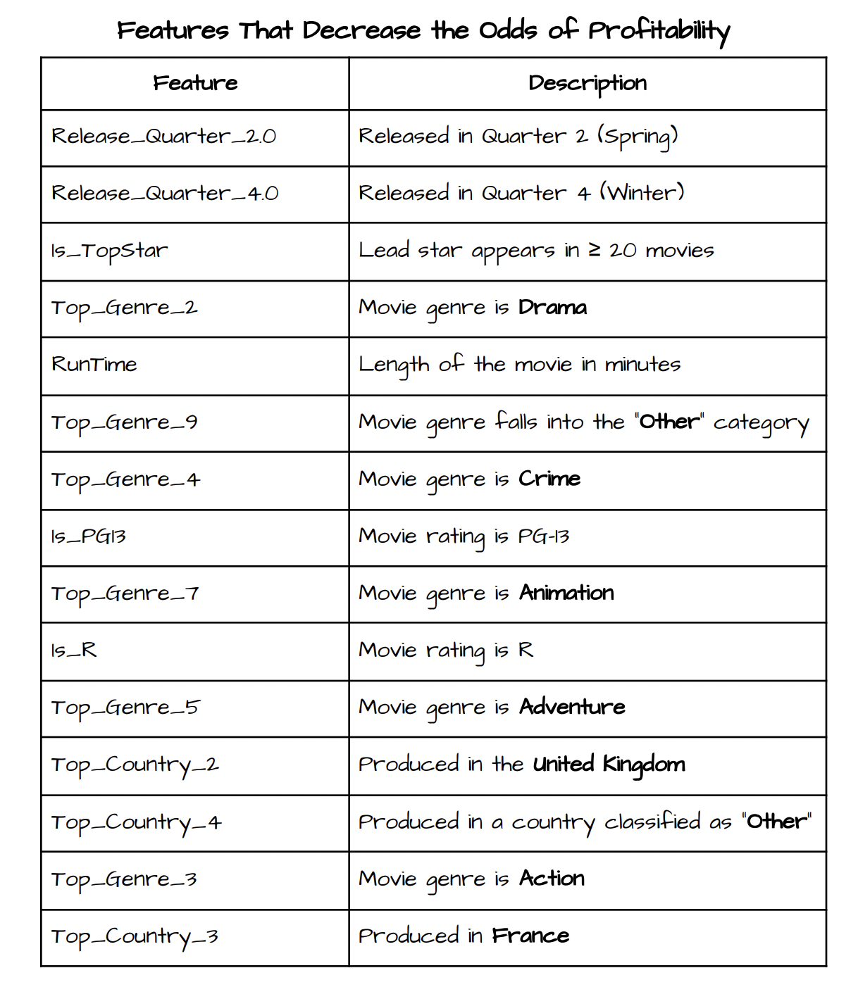

## Adjusting the Threshold
We adjusted the prediction threshold from 50% to 30% to see how it changes the model’s results. Instead of only predicting a movie as profitable when its probability is above 50%, we now consider it profitable if its probability is at least 30%. This lowers the bar for predicting profitable movies and increases how many positives the model finds.

We then calculated the confusion matrix and performance metrics at the new 30% threshold and compared them to the original 50% threshold. Lowering the threshold typically increases sensitivity (recall) meaning the model finds more profitable movies but may reduce specificity and accuracy because it also predicts more false positives. This comparison helps us decide which threshold gives the best balance for our business goal.

In [ ]:
threshold = 0.3

# Predicted probabilities for positive class
y_pred_proba = logreg.predict_proba(X_test)[:, 1]

# Predictions at new 30% threshold
y_pred_30 = (y_pred_proba >= threshold).astype(int)

# Confusion Matrix
cm_30 = confusion_matrix(y_test, y_pred_30)

cm_30_df = pd.DataFrame(cm_30,
                        index=['Actual Negative', 'Actual Positive'],
                        columns=['Predicted Negative', 'Predicted Positive'])

print("Confusion Matrix at 30% threshold:\n")
print(cm_30_df)

print("\n\nConfusion Matrix at 50% threshold:\n")
print(cm_df)

# Extract confusion matrix values
TN_30, FP_30, FN_30, TP_30 = cm_30.ravel()


# Predictive Power (Accuracy)
pred_power_30 = ((TP_30 + TN_30) / (TN_30 + FP_30 + FN_30 + TP_30)) * 100

# Precision
precision_30 = (TP_30 / (TP_30 + FP_30)) * 100

# Sensitivity (Recall)
sensitivity_30 = (TP_30 / (TP_30 + FN_30)) * 100

# Specificity
specificity_30 = (TN_30 / (TN_30 + FP_30)) * 100

# ---- Output of Metrics ---- #

print("\n\n\n--- Model Performance at 30% threshold ---")
print(f"Predictive Power: {pred_power_30:.2f}%")
print(f"Precision: {precision_30:.2f}%")
print(f"Sensitivity: {sensitivity_30:.2f}%")
print(f"Specificity: {specificity_30:.2f}%")


print("\n\n\n--- Model Performance at 50% threshold ---")
print(f"Predictive Power: {pred_power:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Sensitivity: {sensitivity:.2f}%")
print(f"Specificity: {specificity:.2f}%")

Confusion Matrix at 30% threshold:

                 Predicted Negative  Predicted Positive
Actual Negative                 155                 315
Actual Positive                  35                 421


Confusion Matrix at 50% threshold:

                 Predicted Negative  Predicted Positive
Actual Negative                 360                 110
Actual Positive                 176                 280



--- Model Performance at 30% threshold ---
Predictive Power: 62.20%
Precision: 57.20%
Sensitivity: 92.32%
Specificity: 32.98%



--- Model Performance at 50% threshold ---
Predictive Power: 69.11%
Precision: 71.79%
Sensitivity: 61.40%
Specificity: 76.60%


## ROC Curve
We plotted the ROC Curve to evaluate how well the model separates profitable movies from non-profitable ones across different probability thresholds. The curve compares the True Positive Rate (Sensitivity) against the False Positive Rate, showing how model performance changes as we adjust the cutoff.

The AUC score is 0.77, which is noticeably better than random guessing (AUC = 0.50). This indicates that the model has a good ability to distinguish profitable movies from non-profitable ones, even if its accuracy is moderate. A higher AUC means the model ranks positive cases higher than negative cases most of the time.

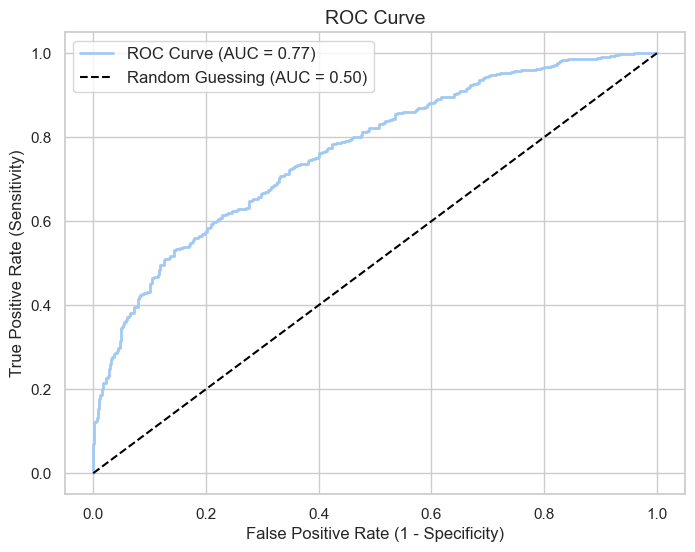

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Generate False Positive Rate (FPR), True Positive Rate (TPR), and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate Area Under the Curve (AUC)
auc_score = roc_auc_score(y_test, y_pred_proba)

# Plot ROC Curve
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, linewidth=2, label=f'ROC Curve (AUC = {auc_score:.2f})')
plt.plot([0,1], [0,1], 'k--', label='Random Guessing (AUC = 0.50)')
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12)
plt.title('ROC Curve', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

## Choosing the Optimal Classification Threshold
We compared model performance across three different probability thresholds: 30%, 50%, and 57.2% (ROC optimal). Lowering the threshold (30%) makes the model very good at finding profitable movies (high sensitivity), but it also produces many false positives, which reduces accuracy and specificity. The standard 50% threshold gives a more balanced result.

Using the optimal threshold of 57.2%, the model improved precision and specificity compared to 50%, meaning it became better at predicting profitable movies accurately and avoiding false positives. Although sensitivity decreased slightly, this threshold provides the best overall balance for our dataset, making it the strongest option if predicting profitability accurately is more important than catching every profitable movie.

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate optimal threshold (closest to top-left corner)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

print(f"Optimal threshold is approximately: {optimal_threshold:.3f}")

Optimal threshold is approximately: 0.572


In [ ]:
threshold = 0.572

# Predicted probabilities for positive class
y_pred_proba = logreg.predict_proba(X_test)[:, 1]

# Predictions at new 57.2% threshold
y_pred_57 = (y_pred_proba >= threshold).astype(int)

# Confusion Matrix
cm_57 = confusion_matrix(y_test, y_pred_57)

cm_57_df = pd.DataFrame(cm_57,
                        index=['Actual Negative', 'Actual Positive'],
                        columns=['Predicted Negative', 'Predicted Positive'])


# Extract confusion matrix values
TN_57, FP_57, FN_57, TP_57 = cm_57.ravel()

# ---- Metrics at 57.2% threshold ---- #

# Predictive Power (Accuracy)
pred_power_57 = ((TP_57 + TN_57) / (TN_57 + FP_57 + FN_57 + TP_57)) * 100

# Precision
precision_57 = (TP_57 / (TP_57 + FP_57)) * 100

# Sensitivity (Recall)
sensitivity_57 = (TP_57 / (TP_57 + FN_57)) * 100

# Specificity
specificity_57 = (TN_57 / (TN_57 + FP_57)) * 100

print("\n\nConfusion Matrix at 57.2% threshold:\n")
print(cm_57_df)

print("\n\nConfusion Matrix at 50% threshold:\n")
print(cm_df)

print("\n\nConfusion Matrix at 30% threshold:\n")
print(cm_30_df)



Confusion Matrix at 57.2% threshold:

                 Predicted Negative  Predicted Positive
Actual Negative                 403                  67
Actual Positive                 215                 241


Confusion Matrix at 50% threshold:

                 Predicted Negative  Predicted Positive
Actual Negative                 360                 110
Actual Positive                 176                 280


Confusion Matrix at 30% threshold:

                 Predicted Negative  Predicted Positive
Actual Negative                 155                 315
Actual Positive                  35                 421


In [ ]:
print("\n\n\n--- Model Performance at 57.2% threshold ---")
print(f"Predictive Power: {pred_power_57:.2f}%")
print(f"Precision: {precision_57:.2f}%")
print(f"Sensitivity: {sensitivity_57:.2f}%")
print(f"Specificity: {specificity_57:.2f}%")


print("\n\n\n--- Model Performance at 50% threshold ---")
print(f"Predictive Power: {pred_power:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Sensitivity: {sensitivity:.2f}%")
print(f"Specificity: {specificity:.2f}%")


print("\n\n\n--- Model Performance at 30% threshold ---")
print(f"Predictive Power: {pred_power_30:.2f}%")
print(f"Precision: {precision_30:.2f}%")
print(f"Sensitivity: {sensitivity_30:.2f}%")
print(f"Specificity: {specificity_30:.2f}%")




--- Model Performance at 57.2% threshold ---
Predictive Power: 69.55%
Precision: 78.25%
Sensitivity: 52.85%
Specificity: 85.74%



--- Model Performance at 50% threshold ---
Predictive Power: 69.11%
Precision: 71.79%
Sensitivity: 61.40%
Specificity: 76.60%



--- Model Performance at 30% threshold ---
Predictive Power: 62.20%
Precision: 57.20%
Sensitivity: 92.32%
Specificity: 32.98%


## Class Imbalance - Using Precision in the ROC Curve

We used the Precision–Recall curve to find the threshold that gives the best balance between correctly identifying profitable movies and accurately predicting them. The best cutoff was around 0.35, which produced the highest F1 score. This means a 35% probability gives the strongest overall performance for our model when both precision and recall are important.

Best threshold (max F1): 0.3520
Precision at best threshold: 0.6071
Recall at best threshold: 0.8575
F1 at best threshold: 0.7109


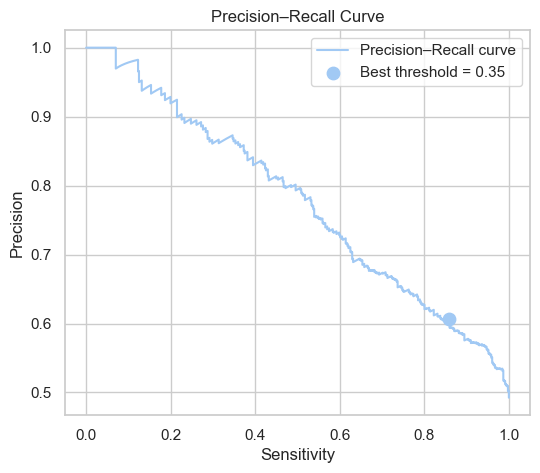

In [ ]:
from sklearn.metrics import precision_recall_curve
import numpy as np
import matplotlib.pyplot as plt

# y_test: true labels (0/1)
# y_pred_proba: predicted probabilities for the positive class

# 1. Get precision, recall, thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)

# 2. Compute F1 score for each threshold (ignore last point which has no threshold)
f1_scores = 2 * (precision[:-1] * recall[:-1]) / (precision[:-1] + recall[:-1] + 1e-8)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]

print(f"Best threshold (max F1): {best_threshold:.4f}")
print(f"Precision at best threshold: {precision[best_idx]:.4f}")
print(f"Recall at best threshold: {recall[best_idx]:.4f}")
print(f"F1 at best threshold: {f1_scores[best_idx]:.4f}")

# 3. Plot Precision–Recall curve
plt.figure(figsize=(6, 5))
plt.plot(recall, precision, label='Precision–Recall curve')
plt.scatter(recall[best_idx], precision[best_idx], marker='o', s=80,
            label=f'Best threshold = {best_threshold:.2f}')
plt.xlabel('Sensitivity')
plt.ylabel('Precision')
plt.title('Precision–Recall Curve')
plt.legend()
plt.grid(True)
plt.show()


## Comparing across all thresholds
We tested how our model performs at four different probability thresholds: 30%, 50%, 57.2% (ROC), and 35% (PR). Each threshold changes how strict the model is when classifying a movie as profitable.

30% threshold finds the most profitable movies (high sensitivity) but makes many false positives, so accuracy and specificity are low.

50% threshold gives balanced performance with reasonable accuracy and recall.

57.2% threshold (ROC) provides the best overall balance by increasing precision and specificity, meaning the predictions of profitability are more reliable with fewer false positives.

35% threshold (PR) improves sensitivity and recall more than the default threshold, making it good at finding profitable movies while still keeping reasonable precision.

Overall, choosing a threshold depends on what matters more—catching all profitable movies (lower thresholds) or being more confident when predicting profitability (higher thresholds). For the best balance of accuracy and reliability, 57.2% is the strongest option.

In [ ]:
from sklearn.metrics import confusion_matrix

# y_test: true labels
# y_pred_proba: predicted probabilities for positive class

def eval_threshold(threshold):
    y_pred = (y_pred_proba >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

    pred_power = (tp + tn) / (tp + tn + fp + fn) * 100      # accuracy
    precision = tp / (tp + fp) * 100 if (tp + fp) > 0 else 0
    sensitivity = tp / (tp + fn) * 100 if (tp + fn) > 0 else 0   # recall
    specificity = tn / (tn + fp) * 100 if (tn + fp) > 0 else 0

    return pred_power, precision, sensitivity, specificity


# --- 50% threshold ---
pred_power, precision, sensitivity, specificity = eval_threshold(0.5)

print("\n\n\n--- Model Performance at 50% threshold ---")
print(f"Predictive Power: {pred_power:.2f}%")
print(f"Precision: {precision:.2f}%")
print(f"Sensitivity: {sensitivity:.2f}%")
print(f"Specificity: {specificity:.2f}%")


# --- 30% threshold ---
pred_power_30, precision_30, sensitivity_30, specificity_30 = eval_threshold(0.3)

print("\n\n\n--- Model Performance at 30% threshold ---")
print(f"Predictive Power: {pred_power_30:.2f}%")
print(f"Precision: {precision_30:.2f}%")
print(f"Sensitivity: {sensitivity_30:.2f}%")
print(f"Specificity: {specificity_30:.2f}%")

# --- 57.2% threshold (from ROC) ---
pred_power_57, precision_57, sensitivity_57, specificity_57 = eval_threshold(0.572)

print("\n\n\n--- Model Performance at 57.2% threshold (ROC Curve)---")
print(f"Predictive Power: {pred_power_57:.2f}%")
print(f"Precision: {precision_57:.2f}%")
print(f"Sensitivity: {sensitivity_57:.2f}%")
print(f"Specificity: {specificity_57:.2f}%")

# --- 35.2% threshold (from PR curve) ---
pred_power_35, precision_35, sensitivity_35, specificity_35 = eval_threshold(0.3520)

print("\n\n\n--- Model Performance at 35.2% threshold (PR Curve)---")
print(f"Predictive Power: {pred_power_35:.2f}%")
print(f"Precision: {precision_35:.2f}%")
print(f"Sensitivity: {sensitivity_35:.2f}%")
print(f"Specificity: {specificity_35:.2f}%")





--- Model Performance at 50% threshold ---
Predictive Power: 69.11%
Precision: 71.79%
Sensitivity: 61.40%
Specificity: 76.60%



--- Model Performance at 30% threshold ---
Predictive Power: 62.20%
Precision: 57.20%
Sensitivity: 92.32%
Specificity: 32.98%



--- Model Performance at 57.2% threshold (ROC Curve)---
Predictive Power: 69.55%
Precision: 78.25%
Sensitivity: 52.85%
Specificity: 85.74%



--- Model Performance at 35.2% threshold (PR Curve)---
Predictive Power: 65.55%
Precision: 60.65%
Sensitivity: 85.53%
Specificity: 46.17%


In [ ]:
# Put into a df for readability

# Collect metrics for scaled model
metrics_scaled = pd.DataFrame({
    'Threshold': [0.5, 0.3, 0.572, 0.352],
    'Accuracy': [pred_power, pred_power_30, pred_power_57, pred_power_35],
    'Precision': [precision, precision_30, precision_57, precision_35],
    'Sensitivity': [sensitivity, sensitivity_30, sensitivity_57, sensitivity_35],
    'Specificity': [specificity, specificity_30, specificity_57, specificity_35]
})

metrics_scaled.index = ['50%', '30%', 'ROC', 'PR']
metrics_scaled


,Threshold,Accuracy,Precision,Sensitivity,Specificity
50%,0.50,69.11,71.79,61.40,76.60
30%,0.30,62.20,57.20,92.32,32.98
ROC,0.57,69.55,78.25,52.85,85.74
PR,0.35,65.55,60.65,85.53,46.17


**Analysis of Our 4 Thresholds for Scaled Feature Modeling**

When evaluating scaled logistic regression model for predicting profitable films, the choice of threshold heavily affects model performance. Note that our Null model (guessing the most common outcome every time) is 50.79%, and that is the baseline accuracy that our model has to beat. All 4 of our thresholds do better than the null model, by roughly 12-20%.

Based on the table of metrics above, we see that:

*   **50% threshold**: shows a baseline performance (balances metrics but only moderate precision and sensitivity)
*   **30% threshold**: maximizes sensitivity (92.32%) but at the cost of a large drop in specificity (32.98%)
*   **35.2% (PR) threshold**: Precision and accuracy increase slightly compared to 30% threshold. Although specificity is improved, it is still low (46.17%), meaning a high rate of false positives.
*   **57.2% (ROC) threshold**: Has the best balance for high-confidence predictions. It has the highest precision (78.25%) and specificity (85.74%), reducing costly false positives. It still has a reasonable sensitivity at 52.85% in identifying profitable films. And it has slightly higher accuracy (69.55%) than the 50% baseline.



## Comparing Models With vs. Without Scaling

Our logistic regression performance results above reflect a model where our continuous features were scaled using StandardScaler (z-score normalization). While scaling may seem like a routine preprocessing step, it can have a significant impact on how the model trains and predicts, especially when the dataset features have very different numeric ranges. For example, our 'Votes' variable ranges from 27 to over 1.8 million, while 'Score' ranges from only 1.50-9.30. Without scaling, the model may treat large scale features such as 'Votes' as more important than 'Score', simply because the numbers are bigger.

Feature scaling helps to prevent this issue by putting all numeric variables on the same scale (standard deviation). This allows the model to evaluate each feature more fairly. Scaling can also help the model to find patterns more efficiently, since large differences in scale can make it harder for the algorithm to settle on the best solution. Finally, scaling improves interpretability, as it allows us to compare the features' coefficients "apples to apples."

**Therefore, we were curious to evaluate whether scaling our movie features really improves our ability to predict profitability. We will compare logistic regression performance with and without feature scaling to see how much this preprocessing step affects our model.**

##**Take unscaled_df and perform same logistic regression steps**

We exported our cleaned dataset that existed right before the scaling step. Then we upload it here to perform the **same logistic regression steps** that we did on the scaled dataset above:

1. Dropping Gross and Target to prevent data leakage
2. Split features from Target
3. Split the dataset into Training set and Test set using 80/20 split
4. Build and train the logistic regression model
5. Make predictions for test data
6. Build confusion matrix
7. Calculate the null model
8. Calculate predictive model (confusion matrix)
9. Calculate accuracy, precision, sensitivity, and specificity of the model
10. Calculate the exponentiated beta coefficients (Odds Ratios)
11. Adjust classification thresholds: 50%, 30%, optimal threshold from ROC curve, optimal threshold from Precision-Recall curve

We will not go into detail on these coding steps below because we've already performed the same code on the scaled features above.

In [ ]:
# Replace with file ID
file_id = "19gb_oJprCti3rguTfzpAyJ6d-ZVLSemt"
url = f"https://drive.google.com/uc?id={file_id}"

# Read the Excel file into a pandas DataFrame
unscaled_df = pd.read_excel(url, index_col='ID')

# Display settings
pd.set_option('display.max_columns', None)

Drop 'Gross' and 'Budget' to prevent data leakage, and drop rows where Target is missing:

In [ ]:
# Drop 'Gross' and 'Budget' to prevent data leakage
unscaled_df.drop(columns=['Gross', 'Budget'], inplace=True)
unscaled_df

,RunTime,Votes,Age,Target,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,,
1,89,280858,39,1.00,3,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,103,264740,39,1.00,4,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,110,236909,39,1.00,2,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,137,280858,39,1.00,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,90,36636,39,1.00,4,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6816,91,9161,9,NaN,4,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
6817,90,1959,9,NaN,3,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0
6818,76,36333,9,1.00,4,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0


In [ ]:
unscaled_df['Target'].value_counts(dropna=False)

Target
0.00    2350
1.00    2277
NaN     2128
Name: count, dtype: int64

In [ ]:
# We see Target has 2128 rows "NA". Drop these columns before modeling.
unscaled_df.dropna(subset=['Target'], inplace=True)

# Check to make sure the 2128 rows were dropped
unscaled_df.shape

(4627, 23)

Split features from Target to prepare for logistic regression:

In [ ]:
# Splitting features and Target:
#X_A as features and y_A as target

X_A = unscaled_df.drop(['Target'], axis=1)
y_A = unscaled_df['Target']

X_A

,RunTime,Votes,Age,Movie_Word_Count,Is_TopStar,Is_TopCompany,Is_R,Is_PG13,Top_Genre_2,Top_Genre_3,Top_Genre_4,Top_Genre_5,Top_Genre_6,Top_Genre_7,Top_Genre_8,Top_Genre_9,Top_Country_2,Top_Country_3,Top_Country_4,Release_Quarter_2.0,Release_Quarter_3.0,Release_Quarter_4.0
ID,,,,,,,,,,,,,,,,,,,,,,
1,89,280858,39,3,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
2,103,264740,39,4,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,110,236909,39,2,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
4,137,280858,39,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
5,90,36636,39,4,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6809,90,17862,9,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
6810,88,7227,9,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6812,92,4556,9,8,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1


Split the dataset into Training set and Test set. Then, build and train the model:

In [ ]:
# Splitting the dataset into the Training set and Test set. N >= 500, use a 80/20 split.

X_train_A, X_test_A, y_train_A, y_test_A = train_test_split(X_A, y_A, test_size=0.2, random_state=42)

In [ ]:
# Creating a Logistic Regression model:
logreg_A = LogisticRegression()

# Training the model:
# Use logreg rule to fit the model. Use the rule I'm giving you to predict the target.
logreg_A.fit(X_train_A, y_train_A)

/Applications/anaconda3/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

Make predictions for test data:

In [ ]:
# Predicting the Test set results:

y_pred_A = logreg_A.predict(X_test_A)

y_pred_A

array([1., 1., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 1., 0., 0., 0., 1.,
       1., 0., 1., 0., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 1., 0., 0.,
       0., 1., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 1., 1.,
       1., 1., 1., 0., 0., 1., 0., 1., 0., 1., 1., 0., 0., 1., 0., 0., 0.,
       0., 1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 1., 1.,
       0., 1., 1., 1., 0., 0., 0., 1., 0., 0., 1., 1., 1., 0., 0., 0., 1.,
       0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 1., 0.,
       0., 1., 0., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 1., 1., 0., 0.,
       0., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 0., 1., 1.,
       1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 1., 0., 1., 1., 1., 1., 1.,
       1., 0., 1., 1., 0.

Building the Confusion Matrix:

In [ ]:
# Building the Confusion Matrix:

print(confusion_matrix(y_test_A, y_pred_A))

[[370 100]
 [199 257]]


In [ ]:
# Creating a more readable matrix:

cm_A = confusion_matrix(y_test_A, y_pred_A)
cm_A_df = pd.DataFrame(cm_A,
                     index=['Actual Negative', 'Actual Positive'],
                     columns=['Predicted Negative', 'Predicted Positive'])

print(cm_A_df)

                 Predicted Negative  Predicted Positive
Actual Negative                 370                 100
Actual Positive                 199                 257


Calculate the Null Model, the minimum baseline we want our model to beat:

The null model remains unchanged (features scaled vs. unscaled) because it does not depend on scaling. The null model is based only on the distribution of the target variable, not on the features nor the preprocessing. Since we are using the same rows of data, the target itself is not scaled, and Target values which don't change, the null model is the same for both the scaled dataset and the unscaled dataset (Null = 50.79%).

In [ ]:
# Calculate the percentage of the sample that is profitable
profitable_perc_A = unscaled_df['Target'].mean() * 100

# Print the results, rounding to 2 decimal places
if profitable_perc_A >= 50:
    null_A = round(profitable_perc_A, 2)
else:
    null_A = round(100 - profitable_perc_A, 2)

print(f"Null Model (unscaled): {null_A}%")

Null Model (unscaled): 50.79%


Calculate unscaled predictive model:

In [ ]:
# Pulling data from the confusion matrix

TN_A, FP_A, FN_A, TP_A = cm_A[0][0], cm_A[0][1], cm_A[1][0], cm_A[1][1]

TN_A, FP_A, FN_A, TP_A

(np.int64(370), np.int64(100), np.int64(199), np.int64(257))

Calculate overall accuracy of the unscaled model:

In [ ]:
# Calculating predictive power (Accuracy):

pred_power_A = round(((TN_A + TP_A) / (TN_A + TP_A + FN_A + FP_A))*100, 2)

print(f"Predictive Power (unscaled): {pred_power_A}%")

Predictive Power (unscaled): 67.71%


Calculate precision of our unscaled model:

In [ ]:
precision_A = round(((TP_A) / (TP_A + FP_A))*100, 2)

print(f"Precision (unscaled): {precision_A}%")

Precision (unscaled): 71.99%


Calculate sensitivity of our unscaled model:

In [ ]:
# The ability to "find" the customers who truly accepted the campaign

sensitivity_A = round(((TP) / (TP + FN))*100, 2)

print(f"Sensitivity (unscaled): {sensitivity_A}%")

Sensitivity (unscaled): 61.4%


Calculate specificity of our unscaled model:

In [ ]:
# The ability to "find" the customers who truly did NOT accept the campaign

specificity_A = round(((TN_A) / (FP_A + TN_A))*100, 2)

print(f"Specificity: {specificity_A}%")

Specificity: 78.72%


Calculate exponentiated beta coefficients (odds ratios) of our unscaled model:

In [ ]:
# Get the coefficients from the unscaled model
coefficients_A = logreg_A.coef_[0]

# Calculate the exponentiated coefficients (odds ratios: exp(B))
odds_ratios_A = np.exp(coefficients_A)

# Combine features and odds ratios, then sort from largest to smallest
sorted_odds_A = sorted(zip(X_A.columns, odds_ratios_A), key=lambda x: x[1], reverse=True)

# Print the sorted odds ratios
for feature, odds in sorted_odds_A:
    print(f"{feature}: exp(b) = {odds:.4f}")

Movie_Word_Count: exp(b) = 1.1369
Age: exp(b) = 1.0420
Is_TopCompany: exp(b) = 1.0319
Top_Genre_8: exp(b) = 1.0272
Release_Quarter_3.0: exp(b) = 1.0241
Top_Genre_6: exp(b) = 1.0091
Top_Genre_7: exp(b) = 1.0038
Is_PG13: exp(b) = 1.0019
Votes: exp(b) = 1.0000
Top_Genre_9: exp(b) = 0.9989
Release_Quarter_2.0: exp(b) = 0.9979
Top_Genre_5: exp(b) = 0.9960
Top_Genre_2: exp(b) = 0.9940
Top_Genre_4: exp(b) = 0.9872
Top_Country_3: exp(b) = 0.9861
Release_Quarter_4.0: exp(b) = 0.9837
Is_TopStar: exp(b) = 0.9808
RunTime: exp(b) = 0.9796
Top_Country_2: exp(b) = 0.9759
Top_Country_4: exp(b) = 0.9693
Is_R: exp(b) = 0.9623
Top_Genre_3: exp(b) = 0.9284


A quick reminder of our SCALED betas for comparison:

In [ ]:
coefficients = logreg.coef_[0]
odds_ratios = np.exp(coefficients)

sorted_odds = sorted(zip(X.columns, odds_ratios), key=lambda x: x[1], reverse=True)

# Print the sorted (scaled) odds ratios
for feature, odds in sorted_odds:
    print(f"{feature}: exp(b) = {odds:.4f}")

Votes: exp(b) = 2.8550
Top_Genre_8: exp(b) = 1.8556
Age: exp(b) = 1.4390
Is_TopCompany: exp(b) = 1.1768
Release_Quarter_3.0: exp(b) = 1.1486
Movie_Word_Count: exp(b) = 1.1154
Top_Genre_6: exp(b) = 1.1008
Release_Quarter_2.0: exp(b) = 0.9592
Release_Quarter_4.0: exp(b) = 0.8219
Is_TopStar: exp(b) = 0.8104
Top_Genre_2: exp(b) = 0.7828
RunTime: exp(b) = 0.7667
Top_Genre_9: exp(b) = 0.7506
Top_Genre_4: exp(b) = 0.6539
Is_PG13: exp(b) = 0.6356
Top_Genre_7: exp(b) = 0.6190
Is_R: exp(b) = 0.5839
Top_Genre_5: exp(b) = 0.5484
Top_Country_2: exp(b) = 0.5292
Top_Country_4: exp(b) = 0.5190
Top_Genre_3: exp(b) = 0.4436
Top_Country_3: exp(b) = 0.3894


**exp(B) Comparison : Scaled vs. Unscaled**

We notice that scaling amplifies differences. In the scaled model, the largest odds ratios are clearly Votes (2.8550), while the smallest are Top_Country_3 (0.3894). In the unscaled model, most of the odds ratios cluster around 1 (range roughly 0.93-1.14), meaning individual features appear to have much smaller effects without scaling.

We also notice that interpretation is not as easy/intuitive in the unscaled model. Because our features have different magnitudes (e.g. Votes vs. Word Count), the coefficients are not directly comparable. Scaling standardizes the units, which explains why scaled exp(B)s are spread out more dramatically.

**Choosing/Comparing Thresholds:**

We will test our unscaled model at the same 50% and 30% thresholds as our scaled model. We will also calculate optimal thresholds using ROC curve and PR curve and test those. At the end we will compare the unscaled model at all 4 thresholds vs. the scaled model at all 4 thresholds for performance analysis.

In [ ]:
threshold = 0.3

# Predicted probabilities for positive class
y_pred_proba_A = logreg_A.predict_proba(X_test_A)[:, 1]

# Predictions at new 30% threshold
y_pred_30_A = (y_pred_proba_A >= threshold).astype(int)

# Confusion Matrix
cm_30_A = confusion_matrix(y_test_A, y_pred_30_A)

cm_30_A_df = pd.DataFrame(cm_30_A,
                        index=['Actual Negative', 'Actual Positive'],
                        columns=['Predicted Negative', 'Predicted Positive'])

print("Confusion Matrix at 30% threshold (Unscaled model):\n")
print(cm_30_A_df)

print("\n\nConfusion Matrix at 50% threshold (Unscaled model):\n")
print(cm_A_df)

# Extract confusion matrix values
TN_30_A, FP_30_A, FN_30_A, TP_30_A = cm_30_A.ravel()


# Predictive Power (Accuracy)
pred_power_30_A = ((TP_30_A + TN_30_A) / (TN_30_A + FP_30_A + FN_30_A + TP_30_A)) * 100

# Precision
precision_30_A = (TP_30_A / (TP_30_A + FP_30_A)) * 100

# Sensitivity (Recall)
sensitivity_30_A = (TP_30_A / (TP_30_A + FN_30_A)) * 100

# Specificity
specificity_30_A = (TN_30_A / (TN_30_A + FP_30_A)) * 100

# ---- Output of Metrics ---- #

print("\n\n\n--- Unscaled Model Performance at 30% threshold ---")
print(f"Predictive Power: {pred_power_30_A:.2f}%")
print(f"Precision: {precision_30_A:.2f}%")
print(f"Sensitivity: {sensitivity_30_A:.2f}%")
print(f"Specificity: {specificity_30_A:.2f}%")


print("\n\n\n--- Unscaled Model Performance at 50% threshold ---")
print(f"Predictive Power: {pred_power_A:.2f}%")
print(f"Precision: {precision_A:.2f}%")
print(f"Sensitivity: {sensitivity_A:.2f}%")
print(f"Specificity: {specificity_A:.2f}%")

Confusion Matrix at 30% threshold (Unscaled model):

                 Predicted Negative  Predicted Positive
Actual Negative                 122                 348
Actual Positive                  40                 416


Confusion Matrix at 50% threshold (Unscaled model):

                 Predicted Negative  Predicted Positive
Actual Negative                 370                 100
Actual Positive                 199                 257



--- Unscaled Model Performance at 30% threshold ---
Predictive Power: 58.10%
Precision: 54.45%
Sensitivity: 91.23%
Specificity: 25.96%



--- Unscaled Model Performance at 50% threshold ---
Predictive Power: 67.71%
Precision: 71.99%
Sensitivity: 61.40%
Specificity: 78.72%


**Using ROC Curve to choose optimal threshold (unscaled):**

ROC gives an optimal threshold of 0.527; we will run our model at 52.7%. With AUC = 0.74, this model shows an improvement of 24% better than our null model at predicting positives. It has a good overall discrimination ability. The optimal ROC threshold = 0.527 maximizes the statistic of (Sensitivity + Specificity - 1). At 0.527, the model achieves a balanced tradeoff between detecting real positives (sensitivity) and avoiding false positive predictions (specificity). This means that a threshold of 0.527 would enable balanced decision making.

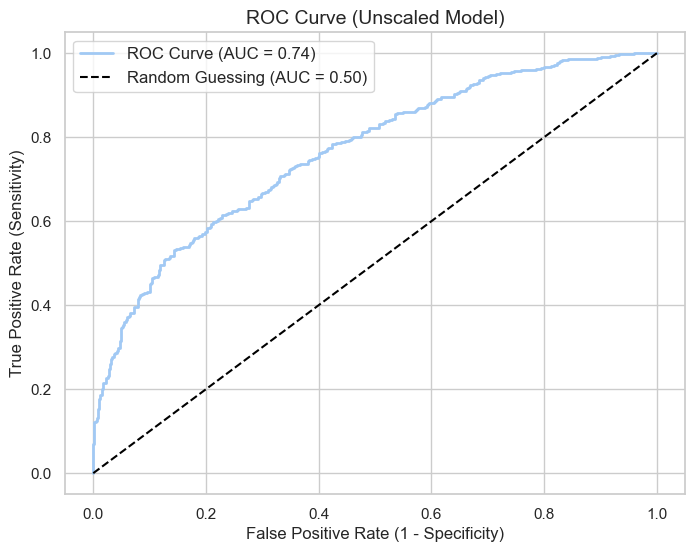

In [ ]:
# Generate False Positive Rate (FPR), True Positive Rate (TPR), and thresholds
fpr_A, tpr_A, thresholds_A = roc_curve(y_test_A, y_pred_proba_A)

# Calculate Area Under the Curve (AUC)
auc_score_A = roc_auc_score(y_test_A, y_pred_proba_A)

# Plot ROC Curve
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, linewidth=2, label=f'ROC Curve (AUC = {auc_score_A:.2f})')
plt.plot([0,1], [0,1], 'k--', label='Random Guessing (AUC = 0.50)')
plt.xlabel('False Positive Rate (1 - Specificity)', fontsize=12)
plt.ylabel('True Positive Rate (Sensitivity)', fontsize=12)
plt.title('ROC Curve (Unscaled Model)', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

In [ ]:
# Calculate optimal threshold (closest to top-left corner)
optimal_idx_A = np.argmax(tpr_A - fpr_A)
optimal_threshold_A = thresholds_A[optimal_idx_A]

print(f"Optimal threshold is approximately: {optimal_threshold_A:.3f}")


Optimal threshold is approximately: 0.527


In [ ]:
# Apply optimal threshold from ROC curve
threshold_A = 0.527

# Predicted probabilities for positive class (unscaled model)
y_pred_proba_A = logreg_A.predict_proba(X_test_A)[:, 1]

# Predictions at new 52.7% threshold
y_pred_53_A = (y_pred_proba_A >= threshold_A).astype(int)

# Confusion Matrix
cm_53_A = confusion_matrix(y_test_A, y_pred_53_A)

cm_53_A_df = pd.DataFrame(cm_53_A,
                        index=['Actual Negative', 'Actual Positive'],
                        columns=['Predicted Negative', 'Predicted Positive'])


# Extract confusion matrix values
TN_53_A, FP_53_A, FN_53_A, TP_53_A = cm_53_A.ravel()

# ---- Metrics at ROC/52.7% threshold ---- #

# Predictive Power (Accuracy)
pred_power_53_A = ((TP_53_A + TN_53_A) / (TN_53_A + FP_53_A + FN_53_A + TP_53_A)) * 100

# Precision
precision_53_A = (TP_53_A / (TP_53_A + FP_53_A)) * 100

# Sensitivity (Recall)
sensitivity_53_A = (TP_53_A / (TP_53_A + FN_53_A)) * 100

# Specificity
specificity_53_A = (TN_53_A / (TN_53_A + FP_53_A)) * 100

In [ ]:
print("Confusion Matrix at 50% threshold:\n")
print(cm_A_df)

print("\n\nConfusion Matrix at 30% threshold:\n")
print(cm_30_A_df)

print("\n\nConfusion Matrix at ROC/52.7% threshold:\n")
print(cm_53_A_df)

Confusion Matrix at 50% threshold:

                 Predicted Negative  Predicted Positive
Actual Negative                 370                 100
Actual Positive                 199                 257


Confusion Matrix at 30% threshold:

                 Predicted Negative  Predicted Positive
Actual Negative                 122                 348
Actual Positive                  40                 416


Confusion Matrix at ROC/52.7% threshold:

                 Predicted Negative  Predicted Positive
Actual Negative                 394                  76
Actual Positive                 220                 236


In [ ]:
print("\n\n\n--- Model Performance at 50% threshold ---")
print(f"Predictive Power: {pred_power_A:.2f}%")
print(f"Precision: {precision_A:.2f}%")
print(f"Sensitivity: {sensitivity_A:.2f}%")
print(f"Specificity: {specificity_A:.2f}%")


print("\n\n\n--- Model Performance at 30% threshold ---")
print(f"Predictive Power: {pred_power_30_A:.2f}%")
print(f"Precision: {precision_30_A:.2f}%")
print(f"Sensitivity: {sensitivity_30_A:.2f}%")
print(f"Specificity: {specificity_30_A:.2f}%")


print("\n\n\n--- Model Performance at ROC/52.7% threshold ---")
print(f"Predictive Power: {pred_power_53_A:.2f}%")
print(f"Precision: {precision_53_A:.2f}%")
print(f"Sensitivity: {sensitivity_53_A:.2f}%")
print(f"Specificity: {specificity_53_A:.2f}%")




--- Model Performance at 50% threshold ---
Predictive Power: 67.71%
Precision: 71.99%
Sensitivity: 61.40%
Specificity: 78.72%



--- Model Performance at 30% threshold ---
Predictive Power: 58.10%
Precision: 54.45%
Sensitivity: 91.23%
Specificity: 25.96%



--- Model Performance at ROC/52.7% threshold ---
Predictive Power: 68.03%
Precision: 75.64%
Sensitivity: 51.75%
Specificity: 83.83%


**Precision-Recall (PR) Curve**:

To evaluate threshold performance, we generated a Precision–Recall curve for the unscaled model and identified the optimal threshold using the maximum F1 score (35.49%). This value is almost identical to the optimal PR threshold from the scaled model (35.2%), showing consistency across preprocessing approaches.

The PR curve is most critical for imbalanced datasets, and especially when the positive class is rare, because accuracy can be misleading in imbalanced datasets. Because our Movies data is balanced with roughly a 50/50 split between profitable and non-profitable films, small differences between scaled and unscaled optimal threshold are expected, and tend to be near 0.5.

Feature scaling primarily affects the magnitude of logistic regression coefficients, not the relative ranking of the predicted probabilities. Since the ranking drives PR and ROC curves, and our dataset is balanced, we would not expect drastic shifts in the optimal PR threshold between scaled and unscaled models.

Best threshold (max F1) — unscaled model: 0.3549
Precision at best threshold: 0.5832
Recall (sensitivity) at best threshold: 0.8684
F1 at best threshold: 0.6978


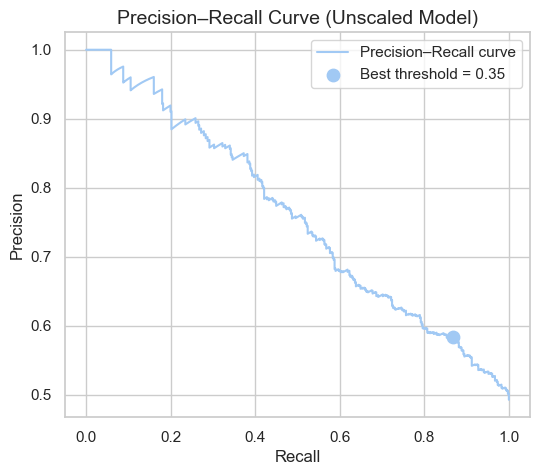

In [ ]:
# y_test_A: true labels (0/1) - unscaled features
# y_pred_proba_A: predicted probabilities for the positive class - unscaled features

# 1. Get precision, recall, thresholds
precision_A, recall_A, thresholds_A = precision_recall_curve(y_test_A, y_pred_proba_A)

# 2. Compute F1 score for each threshold (ignore last point which has no threshold)
f1_scores_A = 2 * (precision_A[:-1] * recall_A[:-1]) / (precision_A[:-1] + recall_A[:-1] + 1e-8)

best_idx_A = np.argmax(f1_scores_A)
best_threshold_A = thresholds_A[best_idx_A]

print(f"Best threshold (max F1) — unscaled model: {best_threshold_A:.4f}")
print(f"Precision at best threshold: {precision_A[best_idx_A]:.4f}")
print(f"Recall (sensitivity) at best threshold: {recall_A[best_idx_A]:.4f}")
print(f"F1 at best threshold: {f1_scores_A[best_idx_A]:.4f}")

# 3. Plot Precision–Recall curve
plt.figure(figsize=(6,5))
plt.plot(recall_A, precision_A, label='Precision–Recall curve')
plt.scatter(recall_A[best_idx_A], precision_A[best_idx_A], marker='o', s=80,
            label=f'Best threshold = {best_threshold_A:.2f}')
plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Precision–Recall Curve (Unscaled Model)', fontsize=14)
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

def eval_threshold_A(threshold):
    y_pred_A = (y_pred_proba_A >= threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test_A, y_pred_A).ravel()

    pred_power = (tp + tn) / (tp + tn + fp + fn) * 100      # accuracy
    precision = tp / (tp + fp) * 100 if (tp + fp) > 0 else 0
    sensitivity = tp / (tp + fn) * 100 if (tp + fn) > 0 else 0   # recall
    specificity = tn / (tn + fp) * 100 if (tn + fp) > 0 else 0

    return pred_power, precision, sensitivity, specificity


# --- 50% threshold ---
pred_power_A, precision_A, sensitivity_A, specificity_A = eval_threshold_A(0.5)

print("\n\n\n--- Model Performance at 50% threshold ---")
print(f"Predictive Power: {pred_power_A:.2f}%")
print(f"Precision: {precision_A:.2f}%")
print(f"Sensitivity: {sensitivity_A:.2f}%")
print(f"Specificity: {specificity_A:.2f}%")


# --- 30% threshold ---
pred_power_30_A, precision_30_A, sensitivity_30_A, specificity_30_A = eval_threshold_A(0.3)

print("\n\n\n--- Model Performance at 30% threshold ---")
print(f"Predictive Power: {pred_power_30_A:.2f}%")
print(f"Precision: {precision_30_A:.2f}%")
print(f"Sensitivity: {sensitivity_30_A:.2f}%")
print(f"Specificity: {specificity_30_A:.2f}%")

# --- 52.7% threshold (from ROC) ---
pred_power_53_A, precision_53_A, sensitivity_53_A, specificity_53_A = eval_threshold_A(0.527)

print("\n\n\n--- Model Performance at 52.7% threshold (from ROC curve)---")
print(f"Predictive Power: {pred_power_53_A:.2f}%")
print(f"Precision: {precision_53_A:.2f}%")
print(f"Sensitivity: {sensitivity_53_A:.2f}%")
print(f"Specificity: {specificity_53_A:.2f}%")

# --- 35.49% threshold (from PR curve) ---
pred_power_35_A, precision_35_A, sensitivity_35_A, specificity_35_A = eval_threshold_A(0.3549)

print("\n\n\n--- Model Performance at 35.49% threshold (from PR curve)---")
print(f"Predictive Power: {pred_power_35_A:.2f}%")
print(f"Precision: {precision_35_A:.2f}%")
print(f"Sensitivity: {sensitivity_35_A:.2f}%")
print(f"Specificity: {specificity_35_A:.2f}%")





--- Model Performance at 50% threshold ---
Predictive Power: 67.71%
Precision: 71.99%
Sensitivity: 56.36%
Specificity: 78.72%



--- Model Performance at 30% threshold ---
Predictive Power: 58.10%
Precision: 54.45%
Sensitivity: 91.23%
Specificity: 25.96%



--- Model Performance at 52.7% threshold (from ROC curve)---
Predictive Power: 68.03%
Precision: 75.64%
Sensitivity: 51.75%
Specificity: 83.83%



--- Model Performance at 35.49% threshold (from PR curve)---
Predictive Power: 62.96%
Precision: 58.32%
Sensitivity: 86.84%
Specificity: 39.79%


In [ ]:
metrics_unscaled = pd.DataFrame({
    'Threshold': [0.5, 0.3, 0.527, 0.3549],
    'Accuracy': [pred_power_A, pred_power_30_A, pred_power_53_A, pred_power_35_A],
    'Precision': [precision_A, precision_30_A, precision_53_A, precision_35_A],
    'Sensitivity': [sensitivity_A, sensitivity_30_A, sensitivity_53_A, sensitivity_35_A],
    'Specificity': [specificity_A, specificity_30_A, specificity_53_A, specificity_35_A]
})

metrics_unscaled.index = ['50%', '30%', 'ROC', 'PR']

**Now we have our metrics for unscaled features:**

In [ ]:
metrics_unscaled

,Threshold,Accuracy,Precision,Sensitivity,Specificity
50%,0.50,67.71,71.99,56.36,78.72
30%,0.30,58.10,54.45,91.23,25.96
ROC,0.53,68.03,75.64,51.75,83.83
PR,0.35,62.96,58.32,86.84,39.79


**And we can compare to our metrics for scaled features:**

In [ ]:
metrics_scaled

,Threshold,Accuracy,Precision,Sensitivity,Specificity
50%,0.50,69.11,71.79,61.40,76.60
30%,0.30,62.20,57.20,92.32,32.98
ROC,0.57,69.55,78.25,52.85,85.74
PR,0.35,65.55,60.65,85.53,46.17


To make it easier to visualize and compare, we combined the two dataframes and added a column for differences (scaled values minus unscaled values). We create a heatmap of those differences for visualizing.

In [ ]:
# Rename columns to make clear which is scaled vs unscaled
metrics_scaled_renamed = metrics_scaled.add_suffix('_scaled')
metrics_unscaled_renamed = metrics_unscaled.add_suffix('_unscaled')

# Combine both tables side by side
metrics_comparison = pd.concat([metrics_scaled_renamed, metrics_unscaled_renamed], axis=1)

metrics_comparison


,Threshold_scaled,Accuracy_scaled,Precision_scaled,Sensitivity_scaled,Specificity_scaled,Threshold_unscaled,Accuracy_unscaled,Precision_unscaled,Sensitivity_unscaled,Specificity_unscaled
50%,0.50,69.11,71.79,61.40,76.60,0.50,67.71,71.99,56.36,78.72
30%,0.30,62.20,57.20,92.32,32.98,0.30,58.10,54.45,91.23,25.96
ROC,0.57,69.55,78.25,52.85,85.74,0.53,68.03,75.64,51.75,83.83
PR,0.35,65.55,60.65,85.53,46.17,0.35,62.96,58.32,86.84,39.79


In [ ]:
metrics_comparison['Accuracy_diff'] = metrics_comparison['Accuracy_scaled'] - metrics_comparison['Accuracy_unscaled']
metrics_comparison['Precision_diff'] = metrics_comparison['Precision_scaled'] - metrics_comparison['Precision_unscaled']
metrics_comparison['Sensitivity_diff'] = metrics_comparison['Sensitivity_scaled'] - metrics_comparison['Sensitivity_unscaled']
metrics_comparison['Specificity_diff'] = metrics_comparison['Specificity_scaled'] - metrics_comparison['Specificity_unscaled']

metrics_comparison

,Threshold_scaled,Accuracy_scaled,Precision_scaled,Sensitivity_scaled,Specificity_scaled,Threshold_unscaled,Accuracy_unscaled,Precision_unscaled,Sensitivity_unscaled,Specificity_unscaled,Accuracy_diff,Precision_diff,Sensitivity_diff,Specificity_diff
50%,0.50,69.11,71.79,61.40,76.60,0.50,67.71,71.99,56.36,78.72,1.40,-0.19,5.04,-2.13
30%,0.30,62.20,57.20,92.32,32.98,0.30,58.10,54.45,91.23,25.96,4.10,2.75,1.10,7.02
ROC,0.57,69.55,78.25,52.85,85.74,0.53,68.03,75.64,51.75,83.83,1.51,2.61,1.10,1.91
PR,0.35,65.55,60.65,85.53,46.17,0.35,62.96,58.32,86.84,39.79,2.59,2.33,-1.32,6.38


In [ ]:
metrics_differences = metrics_comparison[['Accuracy_diff', 'Precision_diff', 'Sensitivity_diff', 'Specificity_diff']]
metrics_differences

,Accuracy_diff,Precision_diff,Sensitivity_diff,Specificity_diff
50%,1.40,-0.19,5.04,-2.13
30%,4.10,2.75,1.10,7.02
ROC,1.51,2.61,1.10,1.91
PR,2.59,2.33,-1.32,6.38


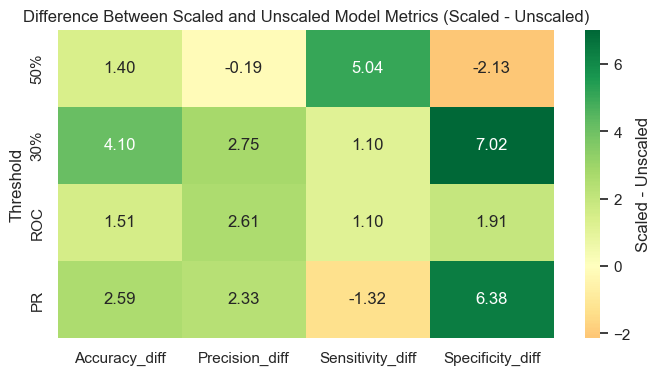

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,4))
sns.heatmap(metrics_differences, annot=True, fmt=".2f", cmap="RdYlGn", center=0, cbar_kws={'label': 'Scaled - Unscaled'})
plt.title("Difference Between Scaled and Unscaled Model Metrics (Scaled - Unscaled)")
plt.ylabel("Threshold")
plt.show()

### Heatmap
The heatmap above displays the differences (scaled - unscaled) of our accuracy, precision, sensitivity, and specificity across the 4 thresholds: 50%, 30%, ROC curve optimal threshold, and PR curve optimal threshold.

*   **Green cells** mean the scaled model performed better
*   **Red cells** (in this case yellow/orange) means the unscaled model performed better.
*   **Numbers** are the actual difference (%)
*   **Numbers Center at 0**: Anything above 0 means scaling improved the metric. Anything below zero means our unscaled model performed better.

### Overall Patterns: Scaled vs. Unscaled Feature Modeling

**We see that scaling improves performance overall** (more green boxes than red). Accuracy consistently increased when scaling was applied. Precision usually increases precision (with the exception of our 50% threshold where it stayed roughly the same (-0.2% decrease). Scaling improves specificity more often than not, with our largest differences showing a +6-7% increase.

**There is a sensitivity and specificity tradeoff that depends on the threshold**. At 50% threshold, sensitivity is improved by +5.04% but specificity decreases by -2.13%. At the PR Curve threshold, sensitivity drops -1.32% but specificity increases by +6.38%. That's due to the nature of the parameters which are opposites - one catching the positives and one catching the negatives. The model's behavior shifts depending on the threshold chosen.

**The best overall improvement occurs at the 30% threshold**. Scaling gave +4.10% accuracy (largest accuracy improvement in the table) as well as +7.02% specificity (largest specificity increase in the table). It also gave moderate increases in precision and sensitivity (+2.75% and +1.10%, respectively).

### Conclusion of Scaled vs. Unscaled Feature Modeling
Based on the metrics, we conclude that the scaled model is superior overall. It delivers higher accuracy all-around, better precision except at 50% threshold where we see a small dip, and better specificity + improved sensitivity in most cases. It also allows us to compare features directly as they are all converted to the same scale, which makes interpretation of our findings much more intuitive. Scaling is an important step and ultimately we would use our scaled model for this ML project.

In [ ]:
metrics_scaled

,Threshold,Accuracy,Precision,Sensitivity,Specificity
50%,0.50,69.11,71.79,61.40,76.60
30%,0.30,62.20,57.20,92.32,32.98
ROC,0.57,69.55,78.25,52.85,85.74
PR,0.35,65.55,60.65,85.53,46.17


## Final Project Summary
The goal of this project was to forecast movie profitability using binary classification. Leveraging a dataset of 6,820 films from 1986–2016, we explored how production characteristics such as genre, budget, score, release year, runtime, rating, and financials contribute to a movie’s likelihood of becoming profitable. Our central question was, **"Can we predict whether a film will generate profit before it is made?"**

To answer this, we applied machine learning and data preparation techniques, including data cleaning, feature selection, scaling, model building, threshold optimization, and validation. Our primary model of interest was a binary logistic regression classifier, selected for its interpretability, probabilistic output, and reliable performance on financial prediction problems.
The project transforms filmmaking intuition into data-driven decision forecasting, allowing studios and investors to estimate financial performance before committing major resources. Instead of relying solely on subjective judgment or historic reputation, our method quantifies profitability as a measurable prediction.

### Workflow and Coding Steps
To prepare the dataset for accurate prediction, we took the coding steps below:

1.   **Data Cleaning and Feature Selection** → Dropped irrelevant and non-predictive variables, removed rows where critical data was missing, and standardized/reformatted categorical variables to be ready for modeling.
2.   **Feature Engineering** → Created our Target (Profitable =1 if Gross>Budget, otherwise 0), converted numerical fields into consistent scales to reduce skew, & one-hot encoded categorical features for algorithm compatibility.
3.   **Feature Scaling** → Applied StandardScaler to normalize/standardize numeric inputs. This ensured that all numeric variables contribute proportionately during model training.
4.   **Model Building and Evaluation** → Trained multiple binary classifiers and compared them (scaled vs. unscaled). Used performance metrics (accuracy, precision, sensitivity, specificity, and ROC/AUC to evaluate tradeoffs and model behavior.
5.   **Threshold Optimization** → After comparing various thresholds (50% probability baseline, the low/30% threshold, ROC optimal threshold, and the PR-curve optimal threshold), we determined our optimized threshold using ROC analysis. This threshold allows the model to align with real businses objectives in our realm of movie profitability.

### Final Selection for our Scaled Model

When selecting the optimal threshold for predicting profitable films, the choice depends on the business objective and risk. In this context of identifying which films will likely be profitable, false positives are much more costly than false negatives, because incorrectly classifying an unprofitable film as profitable may lead to poor investment decisions (wasted production or marketing resources). Therefore, we prioritized **precision and specificity** rather than sensitivity. This ensures that when the model flags a movie as profitable, it is more likely to truly be profitable in real life.

Our scaled logitic regression model performed best under a ROC-derived threshold of 0.572. At this threshold:

*   **Precision: 78.25%** → When the model predicts a movie will be profitable, it is correct about 78% of the time.
*   **Specificity: 85.74%** → The model correctly identifies about 86% of unprofitable movies.
*   **Sensitivity: 52.85%** → The model successfully detects about 53% of profitable movies. This is an acceptable rate, though not overconfident.
*   **Accuracy: 69.55%** → represents a 19% improvement over the null model (50.79%), meaning the model provides substantial predictive value beyond guessing the most common outcome.

This threshold produces **balanced, conservative predictions** and aligns with the goal of correctly identifying profitable films while minimizing the risk of investing in unprofitable projects. We believe raising the threshold further would sharply reduce sensitivity with minimal improvement in precision, which would lead to overly conservative predictions. **Therefore, our final decision is to use the feature-scaled, binary logistic regression model at a threshold of 0.572.**

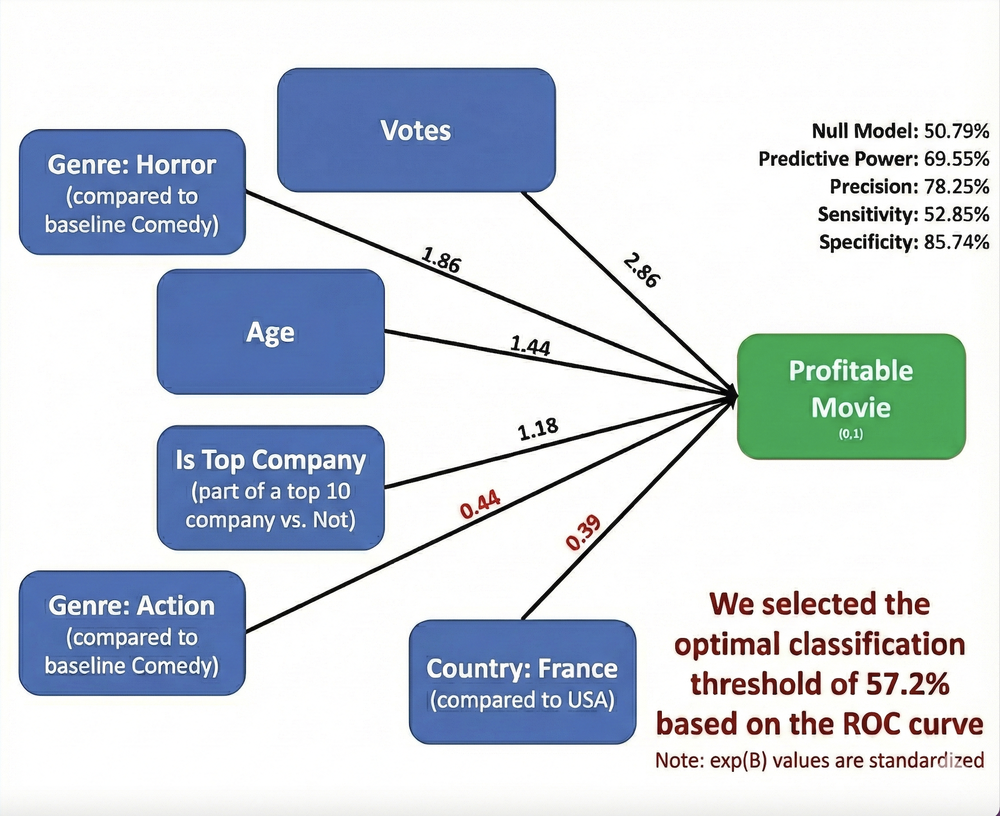

### Key Feature Findings: Odds Ratios (exp(B))

The odds ratios from the scaled logistic regression model reveal which features have the strongest relationships with film profitability. To recap, these feature patterns clearly stand out as our highest and lowest exp(B) features:

**Votes** is the strongest predictor of profitability. Films that generate more audience engagement (measured through Vote count) are substantially more likely to be profitable. Public attention and pre-release promotion are critical indicators of financial success.

**Genre** matters. Horror outperforms, while Action underperforms. Horror films are the most profitable category in our dataset, which makes sense as horror films tend to have low budgets and high returns. In contrast, Action films show the lowest odds of profitability after controlling for other variables. Action films typically have heavy production and marketing costs, which is consistent with our findings.

**Age**: Older films tend to be more profitable. Film Age shows a clear positive relationship with profitability, likely due to long-tail revenue effects such as re-releases, streaming, continued sales, and built-in fan bases. The fans always love and revisit the classics.

**Top Company**: Major studios have an advantage. Films produced by a Top 10 company show higher odds of profitability. Stronger distribution pipelines, established brand image, and larger marketing resources give major studios a drastic financial edge.

**Country of production** shows large differences. U.S.-produced films have the strongest profitability odds. Films made in countries like France and others show substantially lower odds of profitability, reflecting structural differences such as market size, distribution reach, and global appeal.

In summary, a movie’s profitability is influenced by a blend of factors: how much audience interest it generates, the economics of its genre, the strength of the studio behind it, and even where it’s produced. Films that draw strong public engagement, come from lower-cost, high-return genres, and are backed by major studios or production hubs tend to perform much better financially.

## Real-Life Impact: Why Does This Matter?

Producing a movie is a huge financial gamble. Budgets can exceed hundreds of millions, and marketing expenses are often just as significant. A poor decision can wipe out profit margins of the company. Our model provides a profitability screening tool to give film studios and investors a clearer picture of which projects are worth pursuing before commiting financially.

With this model, industry decision-makers can:

*   Evaluate film ideas early before moving forward with expensive production.
*   Strategically prioritize budgets for films with higher predicted profitability.
*   Understand which genres, ratings, and release strategies tend to perform better, providing a competitive edge in planning a film portfolio.
*   Test various hypothetical scenarios to see how profitability odds might change if a certain feature were to be changed.
*   Avoid unnecessary financial losses by flagging films that exhibit low profitability probability.

This model won't be a replacement for creative intuition—film is still an art. Instead, it guides and improves decision-making by pairing creativity with data. Our approach helps studios support artistic vision while also protecting financial sustainability, making the entire filmmaking process more informed, efficient, and strategically grounded.